## Setting up dependencies

In [2]:
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 76.8 MB/s eta 0:00:00:00:0100:01


In [3]:
from pathlib import Path
import pandas as pd
import numpy  as np
import json
from collections import Counter
from shapely.wkt import loads
from shapely.geometry import Polygon, box
import geopandas as gpd
import rasterio
from rasterio.mask import mask
from rasterio.plot import reshape_as_raster
from rasterio.transform import from_bounds
from tqdm.notebook import tqdm

# Visulazation
import  matplotlib.pyplot as plt
from PIL import Image, ImageDraw



# PyTorch and computer vision
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torch.utils.data import Dataset, DataLoader
from torchvision.models.detection import maskrcnn_resnet50_fpn, maskrcnn_resnet50_fpn_v2
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNN, MaskRCNNPredictor
from torchvision.models.detection.roi_heads import RoIHeads
from torchvision.transforms import functional as F

## Read CSV

In [4]:
## df read
train_df = pd.read_csv("/kaggle/input/kuysera-part-2/train_df.csv")
test_df = pd.read_csv("/kaggle/input/kuysera-part-2/test_df.csv")

In [5]:
train_df.head()

,id,pre_image_path,pre_label_path,dataset_type,post_image_path,post_label_path,flood_name,post_min_lon,post_min_lat,post_max_lon,post_max_lat,no-damage,minor-damage,major-damage,destroyed,start_date,end_date,start_date+1,end_date+1
0,socal-fire_00000103,/kaggle/input/tier1-xview-geotiffdata/tier1/im...,/kaggle/input/tier1-xview-geotiffdata/tier1/la...,tier1,/kaggle/input/tier1-xview-geotiffdata/tier1/im...,/kaggle/input/tier1-xview-geotiffdata/tier1/la...,socal-fire,-118.876008,34.127253,-118.871548,34.130636,41,0,0,0,2018-11-08,2018-11-25,2018-11-09,2018-11-26
1,hurricane-harvey_00000196,/kaggle/input/tier1-xview-geotiffdata/tier1/im...,/kaggle/input/tier1-xview-geotiffdata/tier1/la...,tier1,/kaggle/input/tier1-xview-geotiffdata/tier1/im...,/kaggle/input/tier1-xview-geotiffdata/tier1/la...,hurricane-harvey,-95.612518,29.519811,-95.612173,29.522864,0,2,0,0,2017-08-17,2017-09-02,2017-08-18,2017-09-03
2,santa-rosa-wildfire_00000171,/kaggle/input/tier1-xview-geotiffdata/tier1/im...,/kaggle/input/tier1-xview-geotiffdata/tier1/la...,tier1,/kaggle/input/tier1-xview-geotiffdata/tier1/im...,/kaggle/input/tier1-xview-geotiffdata/tier1/la...,santa-rosa-wildfire,-122.746597,38.434199,-122.741335,38.438332,218,0,0,0,2017-10-08,2017-10-31,2017-10-09,2017-11-01
3,hurricane-matthew_00000045,/kaggle/input/tier1-xview-geotiffdata/tier1/im...,/kaggle/input/tier1-xview-geotiffdata/tier1/la...,tier1,/kaggle/input/tier1-xview-geotiffdata/tier1/im...,/kaggle/input/tier1-xview-geotiffdata/tier1/la...,hurricane-matthew,-73.757750,18.227414,-73.753216,18.231900,10,115,2,0,2016-09-28,2016-10-10,2016-09-29,2016-10-11
4,midwest-flooding_00000131,/kaggle/input/tier1-xview-geotiffdata/tier1/im...,/kaggle/input/tier1-xview-geotiffdata/tier1/la...,tier1,/kaggle/input/tier1-xview-geotiffdata/tier1/im...,/kaggle/input/tier1-xview-geotiffdata/tier1/la...,midwest-flooding,-96.326282,36.267320,-96.323929,36.271080,6,0,0,0,2019-03-15,2019-04-01,2019-03-16,2019-04-02


In [6]:
test_df.head()

,id,pre_top_left,pre_top_right,pre_bottom_right,pre_bottom_left,post_top_left,post_top_right,post_bottom_right,post_bottom_left,pre_image_path,post_image_path,flood_name,post_min_lon,post_max_lon,post_min_lat,post_max_lat,start_date,end_date,start_date+1,end_date+1
0,malawi-cyclone_00000000,(-15.824129507838975; 35.002070173540666),(-15.824129507838975; 35.003990425148785),(-15.825037409226914; 35.003990425148785),(-15.825037409226914; 35.002070173540666),(-15.824129507838975; 35.002070173540666),(-15.824129507838975; 35.003990425148785),(-15.825037409226914; 35.003990425148785),(-15.825037409226914; 35.002070173540666),/kaggle/input/testdatakuyeseraaidisasterdamage...,/kaggle/input/testdatakuyeseraaidisasterdamage...,malawi-cyclone,35.002070,35.003990,-15.825037,-15.824130,2023-03-11,2023-03-15,2023-03-12,2023-03-16
1,malawi-cyclone_00000001,(-15.82512979754548; 35.00206749389429),(-15.82512979754548; 35.0039867934907),(-15.826038510517881; 35.0039867934907),(-15.826038510517881; 35.00206749389429),(-15.82512979754548; 35.00206749389429),(-15.82512979754548; 35.0039867934907),(-15.826038510517881; 35.0039867934907),(-15.826038510517881; 35.00206749389429),/kaggle/input/testdatakuyeseraaidisasterdamage...,/kaggle/input/testdatakuyeseraaidisasterdamage...,malawi-cyclone,35.002067,35.003987,-15.826039,-15.825130,2023-03-11,2023-03-15,2023-03-12,2023-03-16
2,malawi-cyclone_00000002,(-15.826127561220138; 35.0020673603379),(-15.826127561220138; 35.00397265326528),(-15.827018452705842; 35.00397265326528),(-15.827018452705842; 35.0020673603379),(-15.826127561220138; 35.0020673603379),(-15.826127561220138; 35.00397265326528),(-15.827018452705842; 35.00397265326528),(-15.827018452705842; 35.0020673603379),/kaggle/input/testdatakuyeseraaidisasterdamage...,/kaggle/input/testdatakuyeseraaidisasterdamage...,malawi-cyclone,35.002067,35.003973,-15.827018,-15.826128,2023-03-11,2023-03-15,2023-03-12,2023-03-16
3,malawi-cyclone_00000003,(-15.827132430009872; 35.002071721612694),(-15.827132430009872; 35.00394794261843),(-15.82799871302644; 35.00394794261843),(-15.82799871302644; 35.002071721612694),(-15.827132430009872; 35.002071721612694),(-15.827132430009872; 35.00394794261843),(-15.82799871302644; 35.00394794261843),(-15.82799871302644; 35.002071721612694),/kaggle/input/testdatakuyeseraaidisasterdamage...,/kaggle/input/testdatakuyeseraaidisasterdamage...,malawi-cyclone,35.002072,35.003948,-15.827999,-15.827132,2023-03-11,2023-03-15,2023-03-12,2023-03-16
4,malawi-cyclone_00000004,(-15.828127278576133; 35.002067048093515),(-15.828127278576133; 35.003956188551655),(-15.828993396128368; 35.003956188551655),(-15.828993396128368; 35.002067048093515),(-15.828127278576133; 35.002067048093515),(-15.828127278576133; 35.003956188551655),(-15.828993396128368; 35.003956188551655),(-15.828993396128368; 35.002067048093515),/kaggle/input/testdatakuyeseraaidisasterdamage...,/kaggle/input/testdatakuyeseraaidisasterdamage...,malawi-cyclone,35.002067,35.003956,-15.828993,-15.828127,2023-03-11,2023-03-15,2023-03-12,2023-03-16


In [6]:
df=train_df

## Train Data Augmentation

### Visualization

In [8]:
import rasterio
import json
import numpy as np
import matplotlib.pyplot as plt
from shapely.wkt import loads
from shapely.geometry import Polygon, box

def plot_disaster_comparison_prepostpoly_bottom(i, df):
    """
    Similar to `plot_disaster_comparison_prepostpoly(i, df)`, 
    but operates on the 'bottom' rectangle [row=571..1023, col=0..956] 
    in the original 1024×1024 image, then shifts that rectangle 
    so it appears at [row=0..452, col=0..956] in a new 1024×1024 canvas.

    2×2 Subplots:
      - Top-left:   Pre-Disaster Original (no clipping)
      - Top-right:  Post-Disaster Original (no clipping)
      - Bottom-left:  Pre-Disaster 'bottom' region clipped & shifted
      - Bottom-right: Post-Disaster 'bottom' region clipped & shifted

    Polygons are color-coded by:
      "pre-building", "no-damage", "minor-damage", "major-damage", "destroyed"
    """

    # The 'bottom' rectangle in the ORIGINAL image (pixel coords).
    # This region has size: (1023 - 571 + 1) = 453 in height, but effectively 452 if we cut at 1023 exclusive
    BOTTOM_TOP    = 571
    BOTTOM_LEFT   = 0
    BOTTOM_BOTTOM = 1023
    BOTTOM_RIGHT  = 956

    # The final "target" rectangle in the NEW 1024×1024 canvas
    # We'll place the clipped region at row=0..452, col=0..956
    FINAL_TOP    = 0
    FINAL_LEFT   = 0
    FINAL_BOTTOM = 452
    FINAL_RIGHT  = 956

    # Create shapely polygons for the old & new rectangle
    bottom_rect_polygon = box(BOTTOM_LEFT, BOTTOM_TOP, BOTTOM_RIGHT, BOTTOM_BOTTOM)
    final_rect_polygon  = box(FINAL_LEFT, FINAL_TOP, FINAL_RIGHT, FINAL_BOTTOM)

    # Retrieve row from DataFrame
    row = df.iloc[i]
    pre_image_path  = row.pre_image_path
    pre_label_path  = row.pre_label_path
    post_image_path = row.post_image_path
    post_label_path = row.post_label_path
    id_ = row.id

    # ---------------------------
    # 1) Read Pre- and Post- images
    # ---------------------------
    with rasterio.open(pre_image_path) as src_pre:
        pre_image = src_pre.read()  # shape (C,H,W)
    with open(pre_label_path, "r") as fpre:
        pre_data = json.load(fpre)

    with rasterio.open(post_image_path) as src_post:
        post_image = src_post.read()  # shape (C,H,W)
    with open(post_label_path, "r") as fpost:
        post_data = json.load(fpost)

    # Check dimensions (assuming 1024×1024)
    # pre_image.shape => (channels, 1024, 1024) e.g.
    _, height_pre, width_pre = pre_image.shape
    _, height_post, width_post = post_image.shape

    # Gather polygons
    pre_polygon_list = []
    for feat in pre_data["features"]["xy"]:
        poly = loads(feat["wkt"])
        if poly.is_valid and not poly.is_empty:
            # We'll label all pre-disaster as 'pre-building'
            pre_polygon_list.append((poly, "pre-building"))

    post_polygon_list = []
    for feat in post_data["features"]["xy"]:
        poly = loads(feat["wkt"])
        if poly.is_valid and not poly.is_empty:
            subtype = feat["properties"].get("subtype", "no-damage")
            post_polygon_list.append((poly, subtype))

    # ---------------------------
    # 2) Create a figure with 2x2 subplots
    # ---------------------------
    fig, axs = plt.subplots(2, 2, figsize=(18, 12))
    (ax1, ax2), (ax3, ax4) = axs

    # ---------------------------
    # 3) Row 1 -> Original images (no polygon clipping)
    # ---------------------------
    # Pre original
    ax1.imshow(np.moveaxis(pre_image, 0, -1))
    ax1.set_title(f"[Original] Pre-Disaster (ID={id_})")
    ax1.axis("off")

    # Post original
    ax2.imshow(np.moveaxis(post_image, 0, -1))
    ax2.set_title(f"[Original] Post-Disaster (ID={id_})")
    ax2.axis("off")

    # We'll define a color map to color polygons
    color_map = {
        "pre-building": (0,   255, 255),  # cyan
        "no-damage":    (0,   255, 0  ),  # green
        "minor-damage": (255, 255, 0  ),  # yellow
        "major-damage": (255, 165, 0  ),  # orange
        "destroyed":    (255, 0,   0  ),  # red
    }

    # Helper for drawing polygons
    def draw_polygons(ax, polygons):
        for (poly, subtype) in polygons:
            if not poly.exterior:
                continue
            px, py = poly.exterior.xy
            rgb = color_map.get(subtype, (255,255,255))
            c = np.array(rgb) / 255.0
            ax.plot(px, py, color=c, linewidth=2)
            ax.fill(px, py, alpha=0.3, color=c)

    # Draw original polygons
    draw_polygons(ax1, pre_polygon_list)
    draw_polygons(ax2, post_polygon_list)

    # ---------------------------
    # 4) Row 2 -> "Bottom" rectangle clipped & SHIFTED
    # We want a new 1024x1024 image where [0..452, 0..956] is the bottom region
    # from the original. The rest is black.
    # ---------------------------

    # 4a) Build new empty arrays for each
    # shape: (C, 1024, 1024), fill with zeros
    pre_bottom_image  = np.zeros((pre_image.shape[0], 1024, 1024), dtype=pre_image.dtype)
    post_bottom_image = np.zeros((post_image.shape[0], 1024, 1024), dtype=post_image.dtype)

    # 4b) Extract the subarray from row=571..1023, col=0..956
    #  and place it at row=0..(1023-571)=452, col=0..956 in the new array
    sub_height = BOTTOM_BOTTOM - BOTTOM_TOP + 1  # 1023 - 571 + 1 => 453
    # but typically if images are 0..1023, it's 1024 px, so effectively 453
    # We'll use min(452, sub_height) if we want exactly 452.

    # We'll do "sub_height = 452" for a clean boundary, ignoring the last row=1023 
    # or you can keep sub_height=453 if you prefer
    sub_height = 452  
    # so the original bottom region is [571..571+452-1] => [571..1022] 
    # skipping row=1023 for a perfect match to your "top=0, bottom=452"

    # Fill the new arrays
    pre_bottom_image[:, 0:sub_height, 0:956] = pre_image[:, 571:571+sub_height, 0:956]
    post_bottom_image[:, 0:sub_height, 0:956] = post_image[:, 571:571+sub_height, 0:956]

    # 4c) Clip & shift polygons
    def filter_clip_shift(polygons):
        """
        1) Intersect with bottom_rect_polygon ([x=0..956], [y=571..1023]).
        2) If partial => clip. If empty => skip.
        3) SHIFT the polygon upward by -571 in Y, so it lands in [0..452].
        4) Then optionally intersect with final_rect_polygon ([x=0..956], [y=0..452]),
           to ensure we stay in-bounds.
        """
        out_polys = []
        for (poly, subtype) in polygons:
            # Intersect with BOTTOM area
            clipped_bottom = poly.intersection(bottom_rect_polygon)
            if clipped_bottom.is_empty:
                continue
            # SHIFT by -571 in Y
            # We'll do an affine translate: x' = x, y' = y - 571
            # shapely can do: clipped_bottom.translate(0, -571)
            # but that requires shapely>=2.0+ or we do shapely.affinity.translate
            from shapely import affinity
            shifted_poly = affinity.translate(clipped_bottom, xoff=0, yoff=-571)

            if shifted_poly.is_empty:
                continue

            # Now we also clip to the final_rect_polygon => [0..956, 0..452] 
            clipped_final = shifted_poly.intersection(final_rect_polygon)
            if clipped_final.is_empty:
                continue

            out_polys.append((clipped_final, subtype))
        return out_polys

    pre_polys_bottom  = filter_clip_shift(pre_polygon_list)
    post_polys_bottom = filter_clip_shift(post_polygon_list)

    # 4d) Plot them in bottom row
    # Convert (C,H,W)->(H,W,C)
    ax3.imshow(np.moveaxis(pre_bottom_image, 0, -1))
    ax3.set_title("[Bottom] Pre-Disaster (Shifted & Clipped)")
    ax3.axis("off")

    ax4.imshow(np.moveaxis(post_bottom_image, 0, -1))
    ax4.set_title("[Bottom] Post-Disaster (Shifted & Clipped)")
    ax4.axis("off")

    draw_polygons(ax3, pre_polys_bottom)
    draw_polygons(ax4, post_polys_bottom)

    plt.tight_layout()
    plt.show()


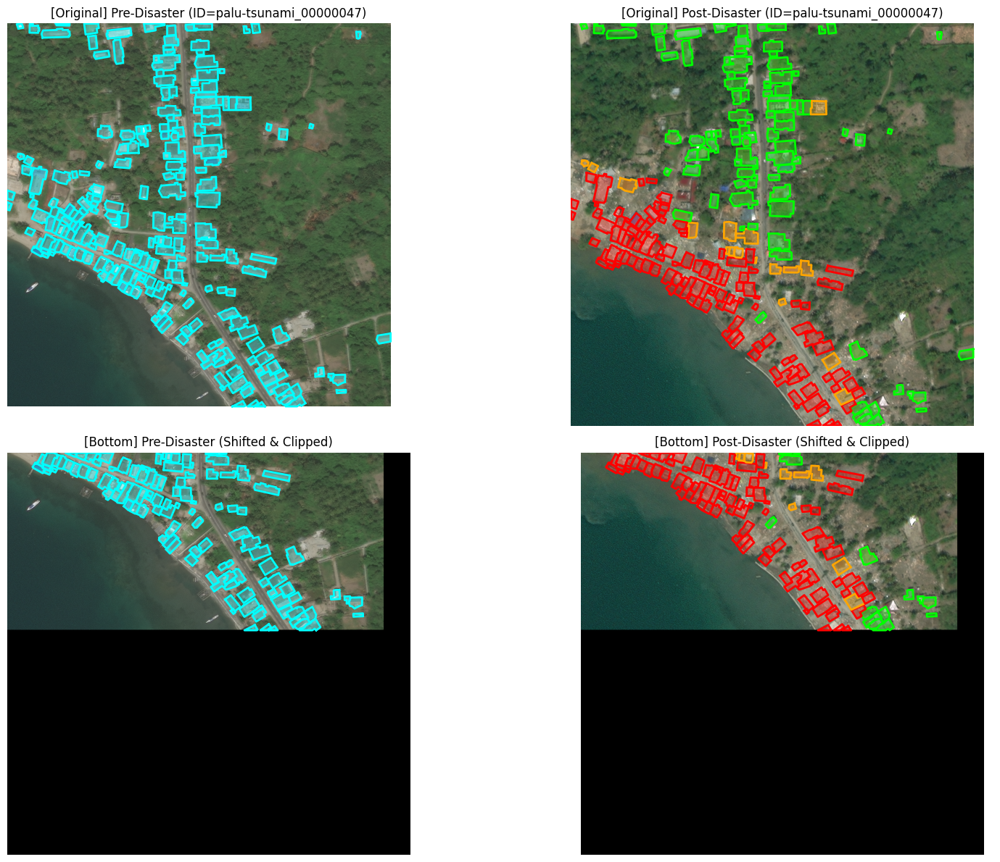

In [9]:
plot_disaster_comparison_prepostpoly_bottom(100, train_df)


### error handled code

In [7]:
import rasterio
import json
import numpy as np
import matplotlib.pyplot as plt
from shapely.wkt import loads
from shapely.geometry import Polygon, box, MultiPolygon
from shapely import affinity

def plot_disaster_comparison_prepostpoly_bottom1(i, df):
    """
    Similar to `plot_disaster_comparison_prepostpoly(i, df)`, 
    but operates on the 'bottom' rectangle [row=571..1023, col=0..956] 
    in the original 1024×1024 image, then shifts that rectangle 
    so it appears at [row=0..452, col=0..956] in a new 1024×1024 canvas.

    2×2 Subplots:
      - Top-left:   Pre-Disaster Original (no clipping)
      - Top-right:  Post-Disaster Original (no clipping)
      - Bottom-left:  Pre-Disaster 'bottom' region clipped & shifted
      - Bottom-right: Post-Disaster 'bottom' region clipped & shifted

    Polygons are color-coded by:
      "pre-building", "no-damage", "minor-damage", "major-damage", "destroyed"
    """
    
    # The 'bottom' rectangle in the ORIGINAL image (pixel coords).
    # This region has size: (1023 - 571 + 1) = 453 in height, but effectively 452 if we cut at 1023 exclusive
    BOTTOM_TOP    = 571
    BOTTOM_LEFT   = 0
    BOTTOM_BOTTOM = 1023
    BOTTOM_RIGHT  = 956

    # The final "target" rectangle in the NEW 1024×1024 canvas
    # We'll place the clipped region at row=0..452, col=0..956 in the new array
    FINAL_TOP    = 0
    FINAL_LEFT   = 0
    FINAL_BOTTOM = 452
    FINAL_RIGHT  = 956

    # Create shapely polygons for the old & new rectangle
    bottom_rect_polygon = box(BOTTOM_LEFT, BOTTOM_TOP, BOTTOM_RIGHT, BOTTOM_BOTTOM)
    final_rect_polygon  = box(FINAL_LEFT, FINAL_TOP, FINAL_RIGHT, FINAL_BOTTOM)

    # Retrieve row from DataFrame
    row = df.iloc[i]
    pre_image_path  = row.pre_image_path
    pre_label_path  = row.pre_label_path
    post_image_path = row.post_image_path
    post_label_path = row.post_label_path
    id_ = row.id

    # ---------------------------
    # 1) Read Pre- and Post- images
    # ---------------------------
    with rasterio.open(pre_image_path) as src_pre:
        pre_image = src_pre.read()  # shape (C,H,W)
    with open(pre_label_path, "r") as fpre:
        pre_data = json.load(fpre)

    with rasterio.open(post_image_path) as src_post:
        post_image = src_post.read()  # shape (C,H,W)
    with open(post_label_path, "r") as fpost:
        post_data = json.load(fpost)

    # Check dimensions (assuming 1024×1024)
    _, height_pre, width_pre = pre_image.shape
    _, height_post, width_post = post_image.shape

    # Gather polygons
    pre_polygon_list = []
    for feat in pre_data["features"]["xy"]:
        try:
            poly = loads(feat["wkt"])
            if poly.is_valid and not poly.is_empty:
                # We'll label all pre-disaster as 'pre-building'
                pre_polygon_list.append((poly, "pre-building"))
        except Exception as e:
            print(f"Error loading pre-disaster polygon: {e}")
            continue

    post_polygon_list = []
    for feat in post_data["features"]["xy"]:
        try:
            poly = loads(feat["wkt"])
            if poly.is_valid and not poly.is_empty:
                subtype = feat["properties"].get("subtype", "no-damage")
                post_polygon_list.append((poly, subtype))
        except Exception as e:
            print(f"Error loading post-disaster polygon: {e}")
            continue

    # ---------------------------
    # 2) Create a figure with 2x2 subplots
    # ---------------------------
    fig, axs = plt.subplots(2, 2, figsize=(18, 12))
    (ax1, ax2), (ax3, ax4) = axs

    # ---------------------------
    # 3) Row 1 -> Original images (no polygon clipping)
    # ---------------------------
    # Pre original
    ax1.imshow(np.moveaxis(pre_image, 0, -1))
    ax1.set_title(f"[Original] Pre-Disaster (ID={id_})")
    ax1.axis("off")

    # Post original
    ax2.imshow(np.moveaxis(post_image, 0, -1))
    ax2.set_title(f"[Original] Post-Disaster (ID={id_})")
    ax2.axis("off")

    # Define a color map to color polygons
    color_map = {
        "pre-building": (0,   255, 255),  # cyan
        "no-damage":    (0,   255, 0  ),  # green
        "minor-damage": (255, 255, 0  ),  # yellow
        "major-damage": (255, 165, 0  ),  # orange
        "destroyed":    (255, 0,   0  ),  # red
    }

    # Helper for drawing polygons with debug and exception handling
    def draw_polygons(ax, polygons):
        """
        Draw each polygon in polygons on the given Axes.
        Handles both Polygon and MultiPolygon types.

        Args:
            ax (matplotlib.axes.Axes): The axes to draw on.
            polygons (list): List of tuples (polygon, subtype).
        """
        for idx, (poly, subtype) in enumerate(polygons, start=1):
            try:
                if isinstance(poly, Polygon):
                    polygons_to_draw = [poly]
                elif isinstance(poly, MultiPolygon):
                    polygons_to_draw = list(poly.geoms)
                    print(f"Sample {idx}: MultiPolygon with {len(polygons_to_draw)} geometries.")
                else:
                    print(f"Sample {idx}: Unsupported geometry type: {type(poly)}")
                    continue

                for sub_idx, single_poly in enumerate(polygons_to_draw, start=1):
                    if single_poly.is_empty:
                        print(f"Sample {idx}, Sub-polygon {sub_idx}: Empty polygon, skipping.")
                        continue
                    if not single_poly.is_valid:
                        print(f"Sample {idx}, Sub-polygon {sub_idx}: Invalid polygon, attempting to fix.")
                        single_poly = single_poly.buffer(0)
                        if single_poly.is_empty or not single_poly.is_valid:
                            print(f"Sample {idx}, Sub-polygon {sub_idx}: Could not fix polygon, skipping.")
                            continue

                    # Extract exterior coordinates
                    if single_poly.exterior:
                        px, py = single_poly.exterior.xy
                        rgb = color_map.get(subtype, (255, 255, 255))
                        c = np.array(rgb) / 255.0
                        ax.plot(px, py, color=c, linewidth=2)
                        ax.fill(px, py, alpha=0.3, color=c)
                    else:
                        print(f"Sample {idx}, Sub-polygon {sub_idx}: No exterior found, skipping.")

            except AttributeError as ae:
                print(f"AttributeError for sample {idx}: {ae}")
                continue
            except Exception as e:
                print(f"Unexpected error for sample {idx}: {e}")
                continue

    # Draw original polygons
    draw_polygons(ax1, pre_polygon_list)
    draw_polygons(ax2, post_polygon_list)

    # ---------------------------
    # 4) Row 2 -> "Bottom" rectangle clipped & SHIFTED
    # ---------------------------

    # 4a) Build new empty arrays for each
    # shape: (C, H, W) -> (C, 1024, 1024), fill with zeros
    pre_bottom_image  = np.zeros((pre_image.shape[0], 1024, 1024), dtype=pre_image.dtype)
    post_bottom_image = np.zeros((post_image.shape[0], 1024, 1024), dtype=post_image.dtype)

    # 4b) Extract the subarray from row=571..1022, col=0..956
    sub_height = FINAL_BOTTOM - FINAL_TOP  # 452 - 0 = 452
    pre_bottom_image[:, FINAL_TOP:FINAL_BOTTOM, FINAL_LEFT:FINAL_RIGHT] = pre_image[:, BOTTOM_TOP:BOTTOM_TOP+sub_height, BOTTOM_LEFT:BOTTOM_LEFT+FINAL_RIGHT]
    post_bottom_image[:, FINAL_TOP:FINAL_BOTTOM, FINAL_LEFT:FINAL_RIGHT] = post_image[:, BOTTOM_TOP:BOTTOM_TOP+sub_height, BOTTOM_LEFT:BOTTOM_LEFT+FINAL_RIGHT]

    # 4c) Clip & shift polygons
    def filter_clip_shift(polygons):
        """
        1) Intersect with bottom_rect_polygon ([x=0..956], [y=571..1023]).
        2) If partial => clip. If empty => skip.
        3) SHIFT the polygon upward by -571 in Y, so it lands in [0..452].
        4) Then optionally intersect with final_rect_polygon ([x=0..956], [y=0..452]),
           to ensure we stay in-bounds.
        """
        out_polys = []
        for (poly, subtype) in polygons:
            try:
                # Intersect with BOTTOM area
                clipped_bottom = poly.intersection(bottom_rect_polygon)
                if clipped_bottom.is_empty:
                    print(f"Polygon with subtype '{subtype}' is fully outside the bottom rectangle, skipping.")
                    continue

                # SHIFT by -571 in Y
                shifted_poly = affinity.translate(clipped_bottom, xoff=0, yoff=-BOTTOM_TOP)

                if shifted_poly.is_empty:
                    print(f"Shifted polygon with subtype '{subtype}' is empty after translation, skipping.")
                    continue

                # Now clip to the final rectangle
                clipped_final = shifted_poly.intersection(final_rect_polygon)
                if clipped_final.is_empty:
                    print(f"Polygon with subtype '{subtype}' is outside the final rectangle after clipping, skipping.")
                    continue

                out_polys.append((clipped_final, subtype))
            except Exception as e:
                print(f"Error processing polygon with subtype '{subtype}': {e}")
                continue
        return out_polys

    pre_polys_bottom  = filter_clip_shift(pre_polygon_list)
    post_polys_bottom = filter_clip_shift(post_polygon_list)

    # 4d) Plot them in bottom row
    # Convert (C,H,W)->(H,W,C)
    ax3.imshow(np.moveaxis(pre_bottom_image, 0, -1))
    ax3.set_title("[Bottom] Pre-Disaster (Shifted & Clipped)")
    ax3.axis("off")

    ax4.imshow(np.moveaxis(post_bottom_image, 0, -1))
    ax4.set_title("[Bottom] Post-Disaster (Shifted & Clipped)")
    ax4.axis("off")

    draw_polygons(ax3, pre_polys_bottom)
    draw_polygons(ax4, post_polys_bottom)

    plt.tight_layout()
    plt.show()

    # ---------------------------
    # 5) FINAL SUMMARIES
    # ---------------------------
    # Optionally, you can add summaries if needed.


Polygon with subtype 'pre-building' is fully outside the bottom rectangle, skipping.
Polygon with subtype 'pre-building' is fully outside the bottom rectangle, skipping.
Polygon with subtype 'pre-building' is fully outside the bottom rectangle, skipping.
Polygon with subtype 'pre-building' is fully outside the bottom rectangle, skipping.
Polygon with subtype 'pre-building' is fully outside the bottom rectangle, skipping.
Polygon with subtype 'pre-building' is fully outside the bottom rectangle, skipping.
Polygon with subtype 'pre-building' is fully outside the bottom rectangle, skipping.
Polygon with subtype 'pre-building' is fully outside the bottom rectangle, skipping.
Polygon with subtype 'pre-building' is fully outside the bottom rectangle, skipping.
Polygon with subtype 'pre-building' is fully outside the bottom rectangle, skipping.
Polygon with subtype 'pre-building' is fully outside the bottom rectangle, skipping.
Polygon with subtype 'pre-building' is fully outside the bottom r

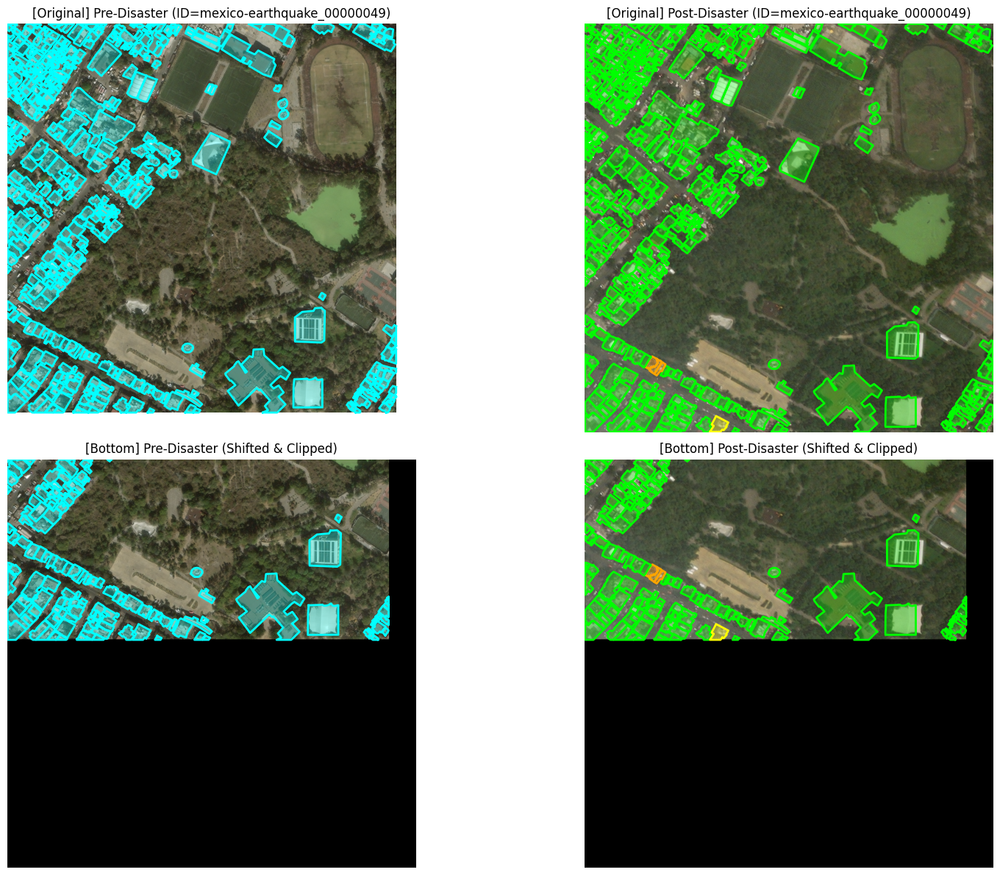

In [8]:
plot_disaster_comparison_prepostpoly_bottom1(89, train_df)

### Plotting original data(not augmented train data )

In [21]:
# Function to plot pre and post images
def plot_disaster_comparison(i, df):
    """
    Plot pre and post disaster images side by side with building damage annotations

    Args:
        i (int): Index of the row in dataframe
        df (pd.DataFrame): Dataframe containing image and label paths
    """
    # Get paths from dataframe
    row = df.iloc[i]
    pre_image_path = row.pre_image_path
    pre_label_path = row.pre_label_path
    post_image_path = row.post_image_path
    post_label_path = row.post_label_path
    id = row.id

    # Load images using rasterio
    with rasterio.open(pre_image_path) as src:
        pre_image = src.read()
    with open(pre_label_path, "r") as file:
        pre_data = json.load(file)
    with rasterio.open(post_image_path) as src:
        post_image = src.read()
    with open(post_label_path, "r") as file:
        post_data = json.load(file)

    # Get polygon lists
    pre_polygon_list = pre_data["features"]["xy"]
    post_polygon_list = post_data["features"]["xy"]

    # Define color mapping
    color_map = {
        "no-damage": (0, 255, 0),  # Green
        "minor-damage": (255, 255, 0),  # Yellow
        "major-damage": (255, 165, 0),  # Orange
        "destroyed": (255, 0, 0),  # Red
        "pre-disaster": (0, 255, 0),  # Green (same as no-damage)
    }

    # Create subplot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 10))

    # Plot pre-disaster image and polygons
    ax1.imshow(np.moveaxis(pre_image, 0, -1))
    for poly_data in pre_polygon_list:
        # Pre-disaster buildings are marked in green
        color = color_map["pre-disaster"]

        polygon = loads(poly_data["wkt"])
        x, y = polygon.exterior.xy

        ax1.plot(x, y, color=np.array(color) / 255, linewidth=2, label="pre-disaster")
        ax1.fill(x, y, alpha=0.3, color=np.array(color) / 255)

    # Remove duplicate labels in pre-image legend
    handles, labels = ax1.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax1.legend(by_label.values(), by_label.keys())
    ax1.set_title(f"Pre-Disaster ID: {id}")

    # Plot post-disaster image and polygons
    ax2.imshow(np.moveaxis(post_image, 0, -1))
    for poly_data in post_polygon_list:
        subtype = poly_data["properties"].get("subtype", "no-damage")
        color = color_map.get(subtype, (255, 255, 255))

        polygon = loads(poly_data["wkt"])
        x, y = polygon.exterior.xy

        ax2.plot(x, y, color=np.array(color) / 255, linewidth=2, label=subtype)
        ax2.fill(x, y, alpha=0.3, color=np.array(color) / 255)

    # Remove duplicate labels in post-image legend
    handles, labels = ax2.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax2.legend(by_label.values(), by_label.keys())
    ax2.set_title(f"Post-Disaster ID: {id}")

    plt.tight_layout()
    plt.show()

    # Print summary statistics
    print_damage_summary(pre_polygon_list, post_polygon_list)


def print_damage_summary(pre_polygon_list, post_polygon_list):
    """Print summary of damage counts"""
    pre_damage_counts = {"pre-disaster": len(pre_polygon_list)}

    post_damage_counts = {}
    for poly in post_polygon_list:
        subtype = poly["properties"].get("subtype", "no-damage")
        post_damage_counts[subtype] = post_damage_counts.get(subtype, 0) + 1

    print("\nDamage Summary:")
    print("Pre-disaster building count:", pre_damage_counts)
    print("Post-disaster building counts:", post_damage_counts)

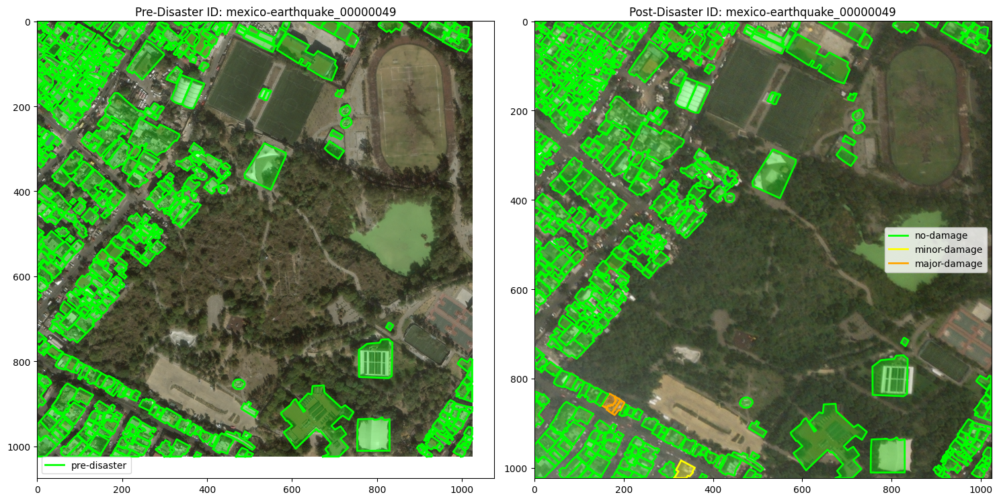


Damage Summary:
Pre-disaster building count: {'pre-disaster': 517}
Post-disaster building counts: {'no-damage': 513, 'minor-damage': 1, 'major-damage': 3}


In [22]:
plot_disaster_comparison(89, train_df)

## augmented data loader for train set

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
import rasterio
import numpy as np
import json
from PIL import Image, ImageDraw
from shapely.geometry import box, Polygon, MultiPolygon
from shapely import affinity
from shapely.wkt import loads  # Essential for parsing WKT strings
from torchvision.transforms import functional as TF
import pandas as pd
import torch.optim as optim
from tqdm import tqdm  # For progress bars

##########################
# 1) HELPER FUNCTIONS
##########################

def mask_pixels_outside_rectangle(image, top, left, bottom, right):
    """
    Zero out (black out) all pixels outside the [top:bottom, left:right] rectangle
    in pixel coordinates.

    image shape: (channels, height, width)
    """
    channels, height, width = image.shape

    # Clamp corners to valid boundaries
    top = max(0, min(top, height))
    left = max(0, min(left, width))
    bottom = max(0, min(bottom, height))
    right = max(0, min(right, width))

    masked = np.copy(image)
    # Top strip
    if top > 0:
        masked[:, :top, :] = 0
    # Bottom strip
    if bottom < height:
        masked[:, bottom:, :] = 0
    # Left strip
    if left > 0:
        masked[:, :, :left] = 0
    # Right strip
    if right < width:
        masked[:, :, right:] = 0

    return masked

def clip_polygon_to_rectangle(polygon, top, left, bottom, right):
    """
    Intersect 'polygon' with the rectangle (left, top, right, bottom).
    polygon is in pixel coords (x=col, y=row).
    Returns the clipped polygon (may be empty).
    """
    rect = box(left, top, right, bottom)  # shapely box
    return polygon.intersection(rect)

def polygon_to_mask(polygon, width, height):
    """
    Rasterize a single polygon into a binary mask of shape [height, width].
    polygon is in pixel coords (x=col, y=row).
    """
    mask_img = Image.new("L", (width, height), 0)
    draw = ImageDraw.Draw(mask_img)

    if polygon.is_empty:
        return np.array(mask_img, dtype=np.uint8)

    # Handle Polygon vs MultiPolygon
    if polygon.geom_type == "Polygon":
        if polygon.exterior is not None:
            x, y = polygon.exterior.coords.xy
            coords = [(xi, yi) for xi, yi in zip(x, y)]
            draw.polygon(coords, outline=1, fill=1)
    elif polygon.geom_type == "MultiPolygon":
        for poly in polygon.geoms:
            if poly.exterior is not None:
                x, y = poly.exterior.coords.xy
                coords = [(xi, yi) for xi, yi in zip(x, y)]
                draw.polygon(coords, outline=1, fill=1)

    return np.array(mask_img, dtype=np.uint8)

##########################
# 2) RESIZE TRANSFORM
##########################

class Resize(object):
    """
    Resizes the image and adjusts the bounding boxes and masks accordingly.
    """
    def __init__(self, size):
        self.size = size  # (height, width)

    def __call__(self, image, target):
        orig_width, orig_height = image.size  # PIL Image size: (width, height)
        new_height, new_width = self.size      # Desired size: (height, width)

        # Perform the resize
        image = TF.resize(image, self.size)

        # Calculate scaling ratios correctly
        ratio_width  = new_width / orig_width
        ratio_height = new_height / orig_height

        # Adjust bounding boxes
        if "boxes" in target and target["boxes"].numel() > 0:
            boxes = target["boxes"]
            # boxes are [xmin, ymin, xmax, ymax]
            boxes[:, [0, 2]] = boxes[:, [0, 2]] * ratio_width
            boxes[:, [1, 3]] = boxes[:, [1, 3]] * ratio_height
            target["boxes"] = boxes

        # Adjust masks
        if "masks" in target and target["masks"].numel() > 0:
            masks = target["masks"]  # shape: (N, H, W)
            masks = masks.unsqueeze(1)  # (N,1,H,W)
            masks = TF.resize(masks, self.size, interpolation=TF.InterpolationMode.NEAREST)
            masks = masks.squeeze(1)  # back to (N,H,W)
            target["masks"] = masks

        return image, target

##########################
# 3) BUILDING DATASET WITH PRE AND POST AUGMENTATION
##########################

class BuildingDatasetPrePostAug(Dataset):
    """
    A dataset that handles both pre-disaster and post-disaster images:
      1. Reads pre and post images using rasterio.
      2. Applies rectangle-based augmentations:
         - Pre: [top=571, left=0, bottom=1023, right=956] shifted to [0,0,452,956] in a new 1024x1024 canvas.
         - Post: [top=571, left=0, bottom=1023, right=956] shifted to [0,0,452,956] in a new 1024x1024 canvas.
      3. Clips and shifts polygons accordingly.
      4. Generates bounding boxes and masks.
      5. Returns both pre and post images with their targets.
    """
    def __init__(self, df, 
                 pre_top=571, pre_left=0, pre_bottom=1023, pre_right=956,
                 post_top=571, post_left=0, post_bottom=1023, post_right=956,
                 resize_size=(1024, 1024)):
        
        self.df = df.reset_index(drop=True)
        self.pre_top = pre_top
        self.pre_left = pre_left
        self.pre_bottom = pre_bottom
        self.pre_right = pre_right

        self.post_top = post_top
        self.post_left = post_left
        self.post_bottom = post_bottom
        self.post_right = post_right

        self.resize_size = resize_size

        # Label mapping
        self.damage_class_to_id = {
            "pre-building": 0,    # Label for pre-disaster buildings
            "no-damage": 1,
            "minor-damage": 2,
            "major-damage": 3,
            "destroyed": 4,
        }
        # Resize transform
        self.resize_transform = Resize(self.resize_size)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        pre_img_path = row.pre_image_path
        pre_label_path = row.pre_label_path
        post_img_path = row.post_image_path
        post_label_path = row.post_label_path
        image_id = torch.tensor([idx])

        # ---------------------------
        # 1) Read Pre-Disaster Image and Labels
        # ---------------------------
        with rasterio.open(pre_img_path) as src_pre:
            pre_image = src_pre.read()  # shape (C, H, W)
        with open(pre_label_path, "r") as fpre:
            pre_data = json.load(fpre)

        pre_polygon_list = []
        for feat in pre_data["features"]["xy"]:
            try:
                poly = loads(feat["wkt"])
                if poly.is_valid and not poly.is_empty:
                    pre_polygon_list.append((poly, "pre-building"))
            except Exception as e:
                print(f"Error loading pre-disaster polygon: {e}")
                continue

        # ---------------------------
        # 2) Read Post-Disaster Image and Labels
        # ---------------------------
        with rasterio.open(post_img_path) as src_post:
            post_image = src_post.read()  # shape (C, H, W)
        with open(post_label_path, "r") as fpost:
            post_data = json.load(fpost)

        post_polygon_list = []
        for feat in post_data["features"]["xy"]:
            try:
                poly = loads(feat["wkt"])
                if poly.is_valid and not poly.is_empty:
                    subtype = feat["properties"].get("subtype", "no-damage")
                    post_polygon_list.append((poly, subtype))
            except Exception as e:
                print(f"Error loading post-disaster polygon: {e}")
                continue

        # ---------------------------
        # 3) Apply Augmentations to Pre-Disaster Image
        # ---------------------------
        # Mask outside pre rectangle
        pre_image_masked = mask_pixels_outside_rectangle(
            pre_image, self.pre_top, self.pre_left, self.pre_bottom, self.pre_right
        )
        # Convert to PIL Image
        pre_image_masked = np.transpose(pre_image_masked, (1, 2, 0)).astype(np.uint8)
        pre_pil = Image.fromarray(pre_image_masked)

        # Create a new blank 1024x1024 image for pre
        pre_new_image = Image.new("RGB", (1024, 1024))
        pre_new_image_np = np.array(pre_new_image)

        # Calculate target placement
        pre_target_top, pre_target_left = 0, 0
        pre_target_bottom, pre_target_right = self.pre_bottom - self.pre_top, self.pre_right - self.pre_left  # 452, 956

        # Crop the pre rectangle
        pre_cropped = pre_pil.crop((self.pre_left, self.pre_top, self.pre_right, self.pre_bottom))
        pre_cropped_np = np.array(pre_cropped)

        # Resize cropped image if necessary
        if pre_cropped_np.shape[0] != (pre_target_bottom - pre_target_top) or pre_cropped_np.shape[1] != (pre_target_right - pre_target_left):
            pre_cropped = pre_cropped.resize((pre_target_right - pre_target_left, pre_target_bottom - pre_target_top), Image.ANTIALIAS)
            pre_cropped_np = np.array(pre_cropped)

        # Place the cropped image into the new canvas
        pre_new_image_np[pre_target_top:pre_target_bottom, pre_target_left:pre_target_right, :] = pre_cropped_np

        # Convert back to PIL Image
        pre_new_image = Image.fromarray(pre_new_image_np)

        # ---------------------------
        # 4) Apply Augmentations to Post-Disaster Image
        # ---------------------------
        # Mask outside post rectangle
        post_image_masked = mask_pixels_outside_rectangle(
            post_image, self.post_top, self.post_left, self.post_bottom, self.post_right
        )
        # Convert to PIL Image
        post_image_masked = np.transpose(post_image_masked, (1, 2, 0)).astype(np.uint8)
        post_pil = Image.fromarray(post_image_masked)

        # Create a new blank 1024x1024 image for post
        post_new_image = Image.new("RGB", (1024, 1024))
        post_new_image_np = np.array(post_new_image)

        # Calculate target placement
        post_target_top, post_target_left = 0, 0
        post_target_bottom, post_target_right = self.post_bottom - self.post_top, self.post_right - self.post_left  # 452, 956

        # Crop the post rectangle
        post_cropped = post_pil.crop((self.post_left, self.post_top, self.post_right, self.post_bottom))
        post_cropped_np = np.array(post_cropped)

        # Resize cropped image if necessary
        if post_cropped_np.shape[0] != (post_target_bottom - post_target_top) or post_cropped_np.shape[1] != (post_target_right - post_target_left):
            post_cropped = post_cropped.resize((post_target_right - post_target_left, post_target_bottom - post_target_top), Image.ANTIALIAS)
            post_cropped_np = np.array(post_cropped)

        # Place the cropped image into the new canvas
        post_new_image_np[post_target_top:post_target_bottom, post_target_left:post_target_right, :] = post_cropped_np

        # Convert back to PIL Image
        post_new_image = Image.fromarray(post_new_image_np)

        # ---------------------------
        # 5) Save Augmented Images for Debugging
        # ---------------------------
        # Uncomment the following lines if you want to save the images for debugging
        # pre_new_image.save(f"debug_pre_aug_{idx}.png")
        # post_new_image.save(f"debug_post_aug_{idx}.png")

        # ---------------------------
        # 6) Process Polygons for Pre-Disaster Image
        # ---------------------------
        pre_boxes, pre_labels, pre_masks = [], [], []
        for annotation in pre_polygon_list:
            poly, subtype = annotation
            damage_label = self.damage_class_to_id.get(subtype, 0)  # "pre-building" => 0

            # Clip polygon to pre rectangle
            clipped_poly = clip_polygon_to_rectangle(
                poly, self.pre_top, self.pre_left, self.pre_bottom, self.pre_right
            )
            if clipped_poly.is_empty:
                continue

            # Shift polygon coordinates upward by pre_top and left_shift (which is 0)
            shifted_poly = affinity.translate(clipped_poly, xoff=-self.pre_left, yoff=-self.pre_top)

            # Clip shifted polygon to target rectangle [0,0,452,956]
            target_rect = box(0, 0, pre_target_right - pre_target_left, pre_target_bottom - pre_target_top)  # [0,0,956,452]
            final_poly = shifted_poly.intersection(target_rect)
            if final_poly.is_empty:
                continue

            # Handle MultiPolygon by splitting into individual Polygons
            if isinstance(final_poly, MultiPolygon):
                polygons_to_add = list(final_poly.geoms)
                print(f"Sample {idx}: Pre-Disaster MultiPolygon split into {len(polygons_to_add)} Polygons.")
            elif isinstance(final_poly, Polygon):
                polygons_to_add = [final_poly]
            else:
                print(f"Sample {idx}: Unsupported geometry type after clipping pre-disaster: {type(final_poly)}")
                continue

            for single_poly in polygons_to_add:
                if not isinstance(single_poly, (Polygon, MultiPolygon)):
                    print(f"Sample {idx}: Unsupported geometry type within polygons_to_add: {type(single_poly)}")
                    continue
                if single_poly.is_empty or not single_poly.is_valid:
                    print(f"Sample {idx}: Pre-Disaster Invalid or Empty Polygon, skipping.")
                    continue

                # Bounding box
                xmin, ymin, xmax, ymax = single_poly.bounds
                pre_boxes.append([xmin, ymin, xmax, ymax])
                pre_labels.append(damage_label)

                # Create mask
                mask_arr = polygon_to_mask(single_poly, pre_target_right - pre_target_left, pre_target_bottom - pre_target_top)
                pre_masks.append(mask_arr)

        # ---------------------------
        # 7) Process Polygons for Post-Disaster Image
        # ---------------------------
        post_boxes, post_labels, post_masks = [], [], []
        for annotation in post_polygon_list:
            poly, subtype = annotation
            damage_label = self.damage_class_to_id.get(subtype, 1)  # Default to "no-damage" => 1

            # Clip polygon to post rectangle
            clipped_poly = clip_polygon_to_rectangle(
                poly, self.post_top, self.post_left, self.post_bottom, self.post_right
            )
            if clipped_poly.is_empty:
                continue

            # Shift polygon coordinates upward by post_top and left_shift (which is 0)
            shifted_poly = affinity.translate(clipped_poly, xoff=-self.post_left, yoff=-self.post_top)

            # Clip shifted polygon to target rectangle [0,0,452,956]
            target_rect = box(0, 0, post_target_right - post_target_left, post_target_bottom - post_target_top)  # [0,0,956,452]
            final_poly = shifted_poly.intersection(target_rect)
            if final_poly.is_empty:
                continue

            # Handle MultiPolygon by splitting into individual Polygons
            if isinstance(final_poly, MultiPolygon):
                polygons_to_add = list(final_poly.geoms)
                print(f"Sample {idx}: Post-Disaster MultiPolygon split into {len(polygons_to_add)} Polygons.")
            elif isinstance(final_poly, Polygon):
                polygons_to_add = [final_poly]
            else:
                print(f"Sample {idx}: Unsupported geometry type after clipping post-disaster: {type(final_poly)}")
                continue

            for single_poly in polygons_to_add:
                if not isinstance(single_poly, (Polygon, MultiPolygon)):
                    print(f"Sample {idx}: Unsupported geometry type within polygons_to_add: {type(single_poly)}")
                    continue
                if single_poly.is_empty or not single_poly.is_valid:
                    print(f"Sample {idx}: Post-Disaster Invalid or Empty Polygon, skipping.")
                    continue

                # Bounding box
                xmin, ymin, xmax, ymax = single_poly.bounds
                post_boxes.append([xmin, ymin, xmax, ymax])
                post_labels.append(damage_label)

                # Create mask
                mask_arr = polygon_to_mask(single_poly, post_target_right - post_target_left, post_target_bottom - post_target_top)
                post_masks.append(mask_arr)

        # ---------------------------
        # 8) Create Targets for Pre and Post
        # ---------------------------
        # Pre-Disaster Targets
        if len(pre_boxes) == 0:
            pre_target = {
                "boxes":  torch.zeros((0, 4), dtype=torch.float32),
                "labels": torch.zeros((0,), dtype=torch.int64),
                "masks":  torch.zeros((0, pre_target_bottom - pre_target_top, pre_target_right - pre_target_left), dtype=torch.uint8),
                "image_id": image_id
            }
        else:
            pre_boxes = torch.as_tensor(pre_boxes, dtype=torch.float32)
            pre_labels = torch.as_tensor(pre_labels, dtype=torch.int64)
            pre_masks = torch.as_tensor(np.stack(pre_masks, axis=0), dtype=torch.uint8)

            # Filter out invalid boxes
            valid_pre = (pre_boxes[:, 2] > pre_boxes[:, 0]) & (pre_boxes[:, 3] > pre_boxes[:, 1])
            pre_boxes = pre_boxes[valid_pre]
            pre_labels = pre_labels[valid_pre]
            pre_masks = pre_masks[valid_pre]

            print(f"Sample {idx}: {len(pre_boxes)} valid pre-disaster boxes after filtering.")

            pre_target = {
                "boxes":  pre_boxes,
                "labels": pre_labels,
                "masks":  pre_masks,
                "image_id": image_id
            }

        # Post-Disaster Targets
        if len(post_boxes) == 0:
            post_target = {
                "boxes":  torch.zeros((0, 4), dtype=torch.float32),
                "labels": torch.zeros((0,), dtype=torch.int64),
                "masks":  torch.zeros((0, post_target_bottom - post_target_top, post_target_right - post_target_left), dtype=torch.uint8),
                "image_id": image_id
            }
        else:
            post_boxes = torch.as_tensor(post_boxes, dtype=torch.float32)
            post_labels = torch.as_tensor(post_labels, dtype=torch.int64)
            post_masks = torch.as_tensor(np.stack(post_masks, axis=0), dtype=torch.uint8)

            # Filter out invalid boxes
            valid_post = (post_boxes[:, 2] > post_boxes[:, 0]) & (post_boxes[:, 3] > post_boxes[:, 1])
            post_boxes = post_boxes[valid_post]
            post_labels = post_labels[valid_post]
            post_masks = post_masks[valid_post]

            print(f"Sample {idx}: {len(post_boxes)} valid post-disaster boxes after filtering.")

            post_target = {
                "boxes":  post_boxes,
                "labels": post_labels,
                "masks":  post_masks,
                "image_id": image_id
            }

        # ---------------------------
        # 9) Resize and Convert to Tensor
        # ---------------------------
        # Pre-Disaster
        pre_resized, pre_target = self.resize_transform(pre_new_image, pre_target)
        pre_tensor = TF.to_tensor(pre_resized)

        # Post-Disaster
        post_resized, post_target = self.resize_transform(post_new_image, post_target)
        post_tensor = TF.to_tensor(post_resized)

        # ---------------------------
        # 10) Save Resized Images for Debugging
        # ---------------------------
        # Uncomment the following lines if you want to save the resized images for debugging
        # pre_resized.save(f"debug_pre_resized_{idx}.png")
        # post_resized.save(f"debug_post_resized_{idx}.png")

        return {
            "pre_img": pre_tensor,
            "pre_target": pre_target,
            "post_img": post_tensor,
            "post_target": post_target
        }

##########################
# 4) BUILDING DATASET RECT AUGMENTATION
##########################

class BuildingDatasetRectAug(Dataset):
    """
    A dataset that:
      1. Reads the post-disaster image using rasterio.
      2. Masks pixels outside the rectangle [TOP,BOTTOM,LEFT,RIGHT].
      3. Filters or clips polygons accordingly (fully-outside => skip, partially => clip).
      4. Builds bounding boxes & masks from the new polygons.
      5. Resizes the final image & masks.
    """
    def __init__(self, df, 
                 top=0, left=0, bottom=452, right=956,
                 resize_size=(1024, 1024)):
        
        self.df = df.reset_index(drop=True)
        self.TOP = top
        self.LEFT = left
        self.BOTTOM = bottom
        self.RIGHT = right
        self.resize_size = resize_size

        # Same label mapping
        self.damage_class_to_id = {
            "no-damage": 1,
            "minor-damage": 2,
            "major-damage": 3,
            "destroyed": 4,
        }
        # We’ll have a resize transform at the end
        self.resize_transform = Resize(self.resize_size)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = row.post_image_path
        label_path = row.post_label_path
        image_id = torch.tensor([idx])

        # 1) Read the image as array [C,H,W]
        with rasterio.open(img_path) as src:
            img_array = src.read()
        # Make sure we have 3 channels
        if img_array.shape[0] >= 3:
            img_array = img_array[:3, :, :]
        else:
            # If only 1 channel, replicate to get 3 channels
            img_array = np.repeat(img_array, 3, axis=0)

        # 2) Mask outside rectangle
        img_array = mask_pixels_outside_rectangle(
            img_array, self.TOP, self.LEFT, self.BOTTOM, self.RIGHT
        )
        # Convert to PIL
        # shape (C,H,W) -> (H,W,C)
        img_array = np.transpose(img_array, (1, 2, 0)).astype(np.uint8)
        img = Image.fromarray(img_array)

        width, height = img.size  # the same as original? partially black

        # 3) Load polygons from the label JSON
        with open(label_path, "r") as f:
            data = json.load(f)
        annots = data["features"]["xy"]

        boxes = []
        labels = []
        masks = []

        # For each polygon => skip if fully outside, else clip if partial
        for annotation in annots:
            subtype = annotation["properties"].get("subtype", "no-damage")
            damage_label = self.damage_class_to_id.get(subtype, 0)
            polygon_wkt = annotation["wkt"]
            polygon = loads(polygon_wkt)
            if not polygon.is_valid or polygon.is_empty:
                continue

            # Clip polygon to image boundary 
            # (in case the polygon extends beyond the original image dims)
            polygon = self._clip_polygon_to_image(polygon, width, height)
            if polygon.is_empty:
                continue

            # Now do the special rectangle-based clip
            clipped_poly = clip_polygon_to_rectangle(
                polygon, self.TOP, self.LEFT, self.BOTTOM, self.RIGHT
            )
            if clipped_poly.is_empty:
                continue

            # final bounding box
            xmin, ymin, xmax, ymax = clipped_poly.bounds
            boxes.append([xmin, ymin, xmax, ymax])
            labels.append(damage_label)

            # final mask
            mask_arr = polygon_to_mask(clipped_poly, width, height)
            masks.append(mask_arr)

        # If no valid polygons remain, create empty targets
        if len(boxes) == 0:
            target = {
                "boxes":  torch.zeros((0, 4), dtype=torch.float32),
                "labels": torch.zeros((0,), dtype=torch.int64),
                "masks":  torch.zeros((0, height, width), dtype=torch.uint8),
                "image_id": image_id
            }
        else:
            boxes  = torch.as_tensor(boxes,  dtype=torch.float32)
            labels = torch.as_tensor(labels, dtype=torch.int64)
            masks  = torch.as_tensor(np.stack(masks, axis=0), dtype=torch.uint8)

            # Filter out invalid boxes
            valid = (boxes[:, 2] > boxes[:, 0]) & (boxes[:, 3] > boxes[:, 1])
            boxes = boxes[valid]
            labels = labels[valid]
            masks = masks[valid]

            print(f"Sample {idx}: {len(boxes)} valid rect-aug boxes after filtering.")

            target = {
                "boxes":  boxes,
                "labels": labels,
                "masks":  masks,
                "image_id": image_id
            }

        # 4) Finally, resize & convert to tensor
        img, target = self.resize_transform(img, target)
        img = TF.to_tensor(img)

        return {"img": img, "target": target}

    def _clip_polygon_to_image(self, polygon, width, height):
        """
        Intersect polygon with the image box [0,0,width,height]
        to ensure we don't go beyond image edges.
        """
        image_box = box(0, 0, width, height)
        return polygon.intersection(image_box)

##########################
# 5) COMBINED DATASET
##########################

class CombinedDataset(Dataset):
    """
    A dataset that combines two datasets.
    It alternates between samples from dataset1 and dataset2.
    """
    def __init__(self, dataset1, dataset2):
        assert len(dataset1) == len(dataset2), "Datasets must have the same length"
        self.dataset1 = dataset1
        self.dataset2 = dataset2
        self.length = len(dataset1) + len(dataset2)

    def __len__(self):
        return self.length

    def __getitem__(self, idx):
        if idx < len(self.dataset1):
            # Get sample from dataset1
            sample = self.dataset1[idx]
            # Ensure the output structure matches
            imgs = [sample["img"]]
            targets = [sample["target"]]
        else:
            # Get sample from dataset2
            sample = self.dataset2[idx - len(self.dataset1)]
            # sample contains pre and post images
            imgs = [sample["pre_img"], sample["post_img"]]
            targets = [sample["pre_target"], sample["post_target"]]
        return imgs, targets

##########################
# 6) CUSTOM COLLATE FUNCTION
##########################

def collate_fn_combined(batch):
    """
    Custom collate function for the CombinedDataset.
    Each item in the batch is a tuple of (imgs, targets),
    where imgs is a list of tensors and targets is a list of dicts.
    This function concatenates all images and targets into single lists.
    """
    imgs = []
    targets = []
    for imgs_list, targets_list in batch:
        imgs.extend(imgs_list)
        targets.extend(targets_list)
    return imgs, targets

##########################
# 7) INSTANTIATE DATASETS
##########################

# Assume train_df is your pandas DataFrame containing the dataset information
# Example:
# train_df = pd.read_csv("/path/to/train_df.csv")

# For demonstration purposes, let's create a dummy train_df
# Replace this with your actual DataFrame loading
# Example structure:
# train_df = pd.DataFrame({
#     'pre_image_path': [...],
#     'pre_label_path': [...],
#     'post_image_path': [...],
#     'post_label_path': [...]
# })

# Replace the following line with your actual DataFrame
# train_df = pd.read_csv("/path/to/train_df.csv")

# Instantiate the individual datasets
train_dataset_prepost_aug = BuildingDatasetPrePostAug(
    df=train_df,
    pre_top=571, pre_left=0, pre_bottom=1023, pre_right=956,          # Pre-Disaster Augmentation
    post_top=571, post_left=0, post_bottom=1023, post_right=956,    # Post-Disaster Augmentation
    resize_size=(1024, 1024)  # As per your requirement
)

train_dataset_aug = BuildingDatasetRectAug(
    df=train_df,
    top=0, left=0, bottom=452, right=956,
    resize_size=(1024, 1024)  # To match the resize size of the other dataset
)

##########################
# 8) INSTANTIATE COMBINED DATASET AND DATALOADER
##########################

# Create the combined dataset
combined_dataset = CombinedDataset(train_dataset_aug, train_dataset_prepost_aug)

# Create the DataLoader with the custom collate function
combined_loader = DataLoader(
    combined_dataset,
    batch_size=4,          # Adjust as needed
    shuffle=True,          # Set to True to shuffle the combined data
    num_workers=4,         # Adjust based on your system
    collate_fn=collate_fn_combined
)




### 31

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def visualize_pre_post_images(pre_img_tensor, pre_target, post_img_tensor, post_target, sample_idx):
    """
    Visualize pre and post images side by side with annotations.
    """
    fig, axs = plt.subplots(1, 2, figsize=(28, 14))

    # ---------------------------
    # Plot Pre-Disaster Image with Annotations
    # ---------------------------
    # Convert image tensor to NumPy
    pre_img_np = pre_img_tensor.permute(1, 2, 0).cpu().numpy()
    pre_img_np = (pre_img_np * 255).astype(np.uint8)

    axs[0].imshow(pre_img_np)
    axs[0].set_title(f"Pre-Disaster Image (Sample {sample_idx})")
    axs[0].axis("off")

    # Draw bounding boxes for pre-disaster
    pre_boxes = pre_target["boxes"].cpu().numpy()  # shape (N, 4)
    pre_labels = pre_target["labels"].cpu().numpy()  # shape (N,)

    # Color map for pre-disaster (assuming 'pre-building' is label 0)
    pre_label_color_map = {
        0: (0, 255, 255),  # pre-building => cyan
    }
    pre_label_to_name = {
        0: "pre-building",
    }

    # Draw bounding boxes for pre-disaster
    for i_pre in range(len(pre_boxes)):
        box = pre_boxes[i_pre]  # [xmin, ymin, xmax, ymax]
        label_id = pre_labels[i_pre]
        xmin, ymin, xmax, ymax = box
        width = xmax - xmin
        height = ymax - ymin

        color_rgb = pre_label_color_map.get(label_id, (255, 255, 255))
        color_norm = (color_rgb[0]/255., color_rgb[1]/255., color_rgb[2]/255.)

        rect = plt.Rectangle(
            (xmin, ymin), width, height,
            fill=False, edgecolor=color_norm, linewidth=2
        )
        axs[0].add_patch(rect)

        damage_str = pre_label_to_name.get(label_id, "unknown")
        axs[0].text(
            xmin, ymin - 5,
            damage_str,
            fontsize=10,
            color="yellow",
            bbox=dict(facecolor="black", alpha=0.5)
        )

    # ---------------------------
    # Plot Post-Disaster Image with Annotations
    # ---------------------------
    # Convert image tensor to NumPy
    post_img_np = post_img_tensor.permute(1, 2, 0).cpu().numpy()
    post_img_np = (post_img_np * 255).astype(np.uint8)

    axs[1].imshow(post_img_np)
    axs[1].set_title(f"Post-Disaster Image (Sample {sample_idx})")
    axs[1].axis("off")

    # Draw bounding boxes for post-disaster
    post_boxes = post_target["boxes"].cpu().numpy()  # shape (N, 4)
    post_labels = post_target["labels"].cpu().numpy()  # shape (N,)

    # Color map for post-disaster
    post_label_color_map = {
        1: (0, 255, 0),      # no-damage => green
        2: (255, 255, 0),    # minor-damage => yellow
        3: (255, 165, 0),    # major-damage => orange
        4: (255, 0, 0),      # destroyed => red
    }
    post_label_to_name = {
        1: "no-damage",
        2: "minor-damage",
        3: "major-damage",
        4: "destroyed"
    }

    # Draw bounding boxes for post-disaster
    for i_post in range(len(post_boxes)):
        box = post_boxes[i_post]  # [xmin, ymin, xmax, ymax]
        label_id = post_labels[i_post]
        xmin, ymin, xmax, ymax = box
        width = xmax - xmin
        height = ymax - ymin

        color_rgb = post_label_color_map.get(label_id, (255, 255, 255))
        color_norm = (color_rgb[0]/255., color_rgb[1]/255., color_rgb[2]/255.)

        rect = plt.Rectangle(
            (xmin, ymin), width, height,
            fill=False, edgecolor=color_norm, linewidth=2
        )
        axs[1].add_patch(rect)

        damage_str = post_label_to_name.get(label_id, "unknown")
        axs[1].text(
            xmin, ymin - 5,
            damage_str,
            fontsize=10,
            color="yellow",
            bbox=dict(facecolor="black", alpha=0.5)
        )

    plt.tight_layout()
    plt.show()


In [17]:
def visualize_batch_prepost(data_loader, batch_idx=0):
    """
    Visualize a specific batch from the pre-post augmented data loader.
    For each sample in the batch, display two images:
        - Left: Pre-Disaster Image with Annotations.
        - Right: Post-Disaster Image with Annotations (color-coded by damage class).

    Args:
        data_loader (DataLoader): DataLoader with pre-post augmented dataset.
        batch_idx (int): Index of the batch to visualize (0-based).
    """
    # Iterate through the data loader
    for i, batch in enumerate(data_loader):
        if i < batch_idx:
            continue

        pre_imgs = batch["pre_imgs"]       # List of pre-disaster image tensors
        pre_targets = batch["pre_targets"] # List of pre-disaster targets
        post_imgs = batch["post_imgs"]     # List of post-disaster image tensors
        post_targets = batch["post_targets"] # List of post-disaster targets

        batch_size = len(pre_imgs)

        # Iterate through each sample in the batch
        for sample_idx in range(batch_size):
            pre_img_tensor = pre_imgs[sample_idx]
            pre_target = pre_targets[sample_idx]
            post_img_tensor = post_imgs[sample_idx]
            post_target = post_targets[sample_idx]

            print(f"\n=== Batch {batch_idx}, Sample {sample_idx} ===")
            print(f"Pre-Image shape: {pre_img_tensor.shape}")
            print(f"Pre-Target keys: {pre_target.keys()}")
            print(f"Pre-# of bounding boxes = {pre_target['boxes'].shape[0]}")

            print(f"Post-Image shape: {post_img_tensor.shape}")
            print(f"Post-Target keys: {post_target.keys()}")
            print(f"Post-# of bounding boxes = {post_target['boxes'].shape[0]}")

            # Use the helper function to visualize
            visualize_pre_post_images(pre_img_tensor, pre_target, post_img_tensor, post_target, sample_idx)

        break  # Only visualize the specified batch


## beofre merge

In [54]:
import torch
from torch.utils.data import Dataset, DataLoader, ConcatDataset

class PrePostAugWrapper(Dataset):
    """
    Wrapper for BuildingDatasetPrePostAug to standardize output keys.
    Concatenates pre and post images along the channel dimension and merges targets.
    """
    def __init__(self, dataset):
        self.dataset = dataset

    def __getitem__(self, idx):
        data = self.dataset[idx]
        
        # Concatenate pre and post images along the channel dimension
        pre_img = data["pre_img"]  # Tensor shape: [C, H, W]
        post_img = data["post_img"]  # Tensor shape: [C, H, W]
        concatenated_img = torch.cat([pre_img, post_img], dim=0)  # New shape: [2C, H, W]
        
        # Merge targets
        pre_target = data["pre_target"]
        post_target = data["post_target"]
        
        # Combine boxes
        boxes = torch.cat([pre_target["boxes"], post_target["boxes"]], dim=0)
        
        # Combine labels
        labels = torch.cat([pre_target["labels"], post_target["labels"]], dim=0)
        
        # Combine masks
        masks = torch.cat([pre_target["masks"], post_target["masks"]], dim=0)
        
        # Combine image IDs (assuming they are the same)
        image_id = pre_target["image_id"]
        
        # Create a unified target dictionary
        target = {
            "boxes": boxes,
            "labels": labels,
            "masks": masks,
            "image_id": image_id
        }
        
        return {"img": concatenated_img, "target": target}

    def __len__(self):
        return len(self.dataset)

class RectAugWrapper(Dataset):
    """
    Wrapper for BuildingDatasetRectAug to standardize output keys.
    """
    def __init__(self, dataset):
        self.dataset = dataset

    def __getitem__(self, idx):
        data = self.dataset[idx]
        # Ensure 'img' and 'target' are present
        return {
            "img": data["img"],       # Tensor shape: [C, H, W]
            "target": data["target"]  # Dictionary with boxes, labels, masks, image_id
        }

    def __len__(self):
        return len(self.dataset)

# Assuming train_dataset_prepost_aug and train_dataset_aug are already defined
wrapped_dataset1 = PrePostAugWrapper(train_dataset_prepost_aug)
wrapped_dataset2 = RectAugWrapper(train_dataset_aug)

# Combine the datasets
combined_dataset = ConcatDataset([wrapped_dataset1, wrapped_dataset2])

def custom_collate_fn(batch):
    """
    Custom collate function to handle batches of dictionaries.
    """
    imgs = [item["img"] for item in batch]  # List of tensors
    targets = [item["target"] for item in batch]  # List of dictionaries

    # Stack images into a single tensor
    imgs = torch.stack(imgs, dim=0)  # Shape: [batch_size, C, H, W]
    
    return {"img": imgs, "target": targets}

# Create the DataLoader
combined_loader = DataLoader(
    combined_dataset,
    batch_size=4,            # Adjust based on your GPU memory
    shuffle=True,            # Shuffle the combined dataset
    num_workers=4,           # Adjust based on your CPU cores
    collate_fn=custom_collate_fn
)



#### plot dataloaders

In [21]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def plot_sample_with_polygons(img_tensor, target):
    """
    For a single sample, create two subplots:
      - Left = raw image
      - Right = image with bounding boxes color-coded by damage class

    Args:
        img_tensor (torch.Tensor): shape [C, H, W]
        target (dict): with keys 'boxes' (Tensor Nx4) and 'labels' (Tensor N)
    """
    # Convert image to NumPy, shape [H, W, C], scale to [0..255]
    img_np = img_tensor.permute(1, 2, 0).cpu().numpy()
    img_np = (img_np * 255).astype(np.uint8)

    # Prepare subplots
    fig, (ax_left, ax_right) = plt.subplots(1, 2, figsize=(14, 7))

    # -- (1) Left: raw image
    ax_left.imshow(img_np)
    ax_left.set_title("Raw Image")
    ax_left.axis("off")

    # -- (2) Right: with bounding boxes
    ax_right.imshow(img_np)
    ax_right.set_title("Image w/ Damage BBoxes")
    ax_right.axis("off")

    boxes = target["boxes"].cpu().numpy()  # shape (N, 4)
    labels = target["labels"].cpu().numpy()  # shape (N,)

    # Optional color map for each label ID
    label_color_map = {
        1: (0,   255, 0  ),  # no-damage => green
        2: (255, 255, 0  ),  # minor-damage => yellow
        3: (255, 165, 0  ),  # major-damage => orange
        4: (255, 0,   0  ),  # destroyed => red
    }
    # We can also define a label → string name
    label_to_name = {
        1: "no-damage",
        2: "minor-damage",
        3: "major-damage",
        4: "destroyed"
    }

    # Draw bounding boxes
    for i in range(len(boxes)):
        box = boxes[i]  # [xmin, ymin, xmax, ymax]
        label_id = labels[i]
        xmin, ymin, xmax, ymax = box
        width  = xmax - xmin
        height = ymax - ymin

        # Convert (R,G,B) from 0..255 => normalized
        color_rgb = label_color_map.get(label_id, (255, 255, 255))
        color_norm = (color_rgb[0]/255., color_rgb[1]/255., color_rgb[2]/255.)

        # Add bounding box
        rect = plt.Rectangle(
            (xmin, ymin), width, height,
            fill=False, edgecolor=color_norm, linewidth=2
        )
        ax_right.add_patch(rect)

        # Add label text
        damage_str = label_to_name.get(label_id, "unknown")
        ax_right.text(
            xmin, ymin - 5,
            damage_str,
            fontsize=10,
            color="yellow",
            bbox=dict(facecolor="black", alpha=0.5)
        )

    plt.tight_layout()
    plt.show()


def visualize_batch(data_loader, batch_idx=0):
    """
    Grab the 'batch_idx'-th batch from 'data_loader'.
    For each sample in that batch, show two subplots:
      - raw image
      - image with bounding boxes color-coded by damage class
    """
    # We'll iterate through the data loader. The first time i == batch_idx, we use that batch.
    for i, (images, targets) in enumerate(data_loader):
        if i < batch_idx:
            continue
        # 'images' is a list of Tensors or a Tensor, depending on collate_fn
        # 'targets' is a list of dicts

        # For each sample in the batch
        for sample_idx in range(len(images)):
            img_tensor = images[sample_idx]
            target = targets[sample_idx]

            print(f"\n=== Batch {batch_idx}, Sample {sample_idx} ===")
            print(f"Image shape: {img_tensor.shape}")
            print("Target keys:", target.keys())
            # We can also print # of boxes
            num_boxes = target["boxes"].shape[0]
            print(f"# of bounding boxes = {num_boxes}")

            # Plot sample in 2 subplots
            plot_sample_with_polygons(img_tensor, target)

        break  # Only visualize that single batch, then stop




=== Batch 0, Sample 0 ===
Image shape: torch.Size([3, 1024, 1024])
Target keys: dict_keys(['boxes', 'labels', 'masks', 'image_id'])
# of bounding boxes = 280


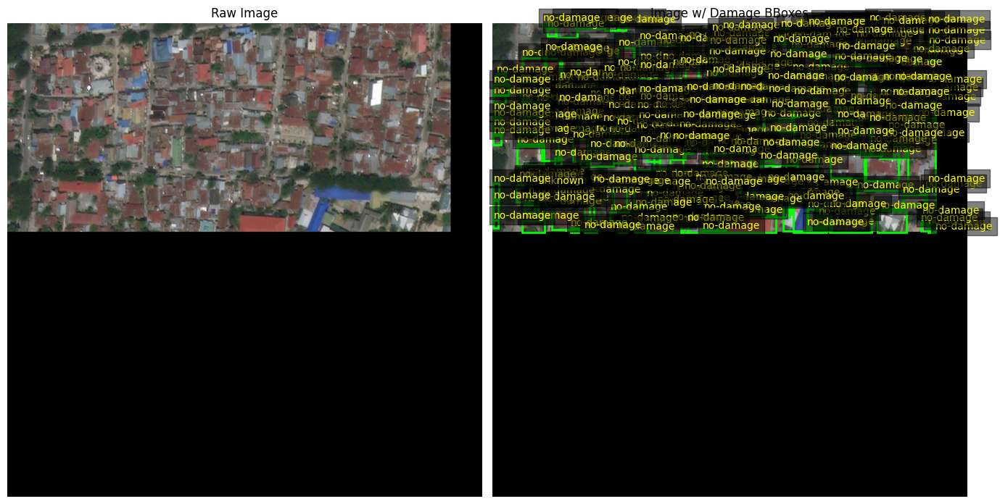


=== Batch 0, Sample 1 ===
Image shape: torch.Size([3, 1024, 1024])
Target keys: dict_keys(['boxes', 'labels', 'masks', 'image_id'])
# of bounding boxes = 86


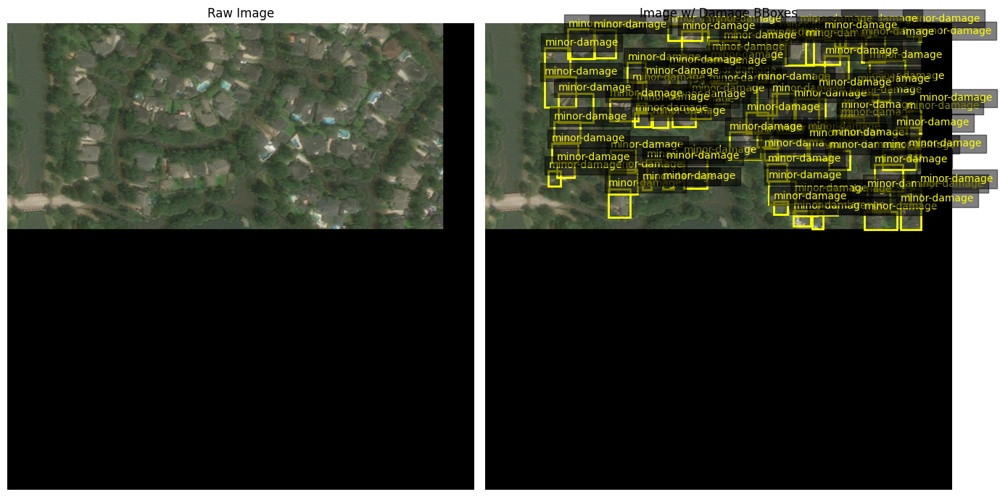


=== Batch 0, Sample 2 ===
Image shape: torch.Size([3, 1024, 1024])
Target keys: dict_keys(['boxes', 'labels', 'masks', 'image_id'])
# of bounding boxes = 4


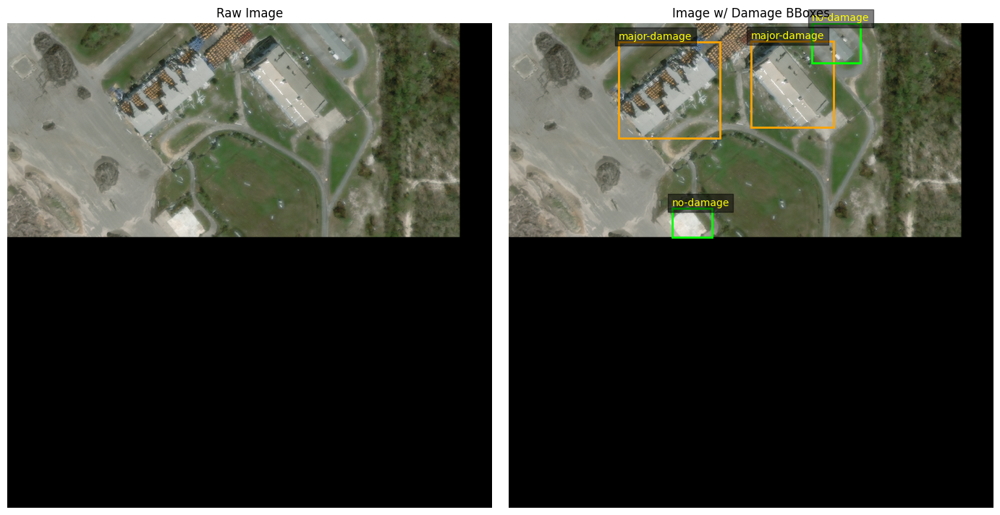


=== Batch 0, Sample 3 ===
Image shape: torch.Size([3, 1024, 1024])
Target keys: dict_keys(['boxes', 'labels', 'masks', 'image_id'])
# of bounding boxes = 49


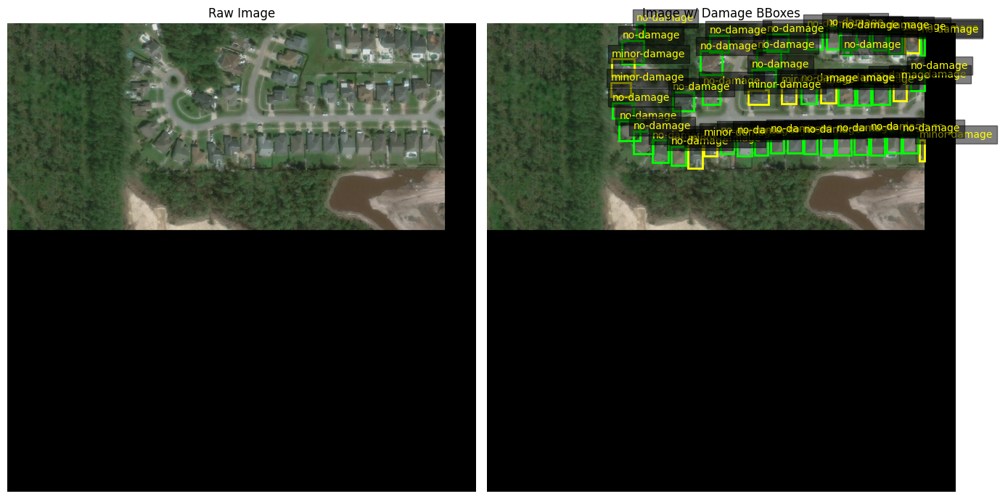

In [11]:
# Suppose you have:
# train_loader_aug = DataLoader(train_dataset_aug, batch_size=4, ...)
visualize_batch(train_loader_aug, batch_idx=0)



=== Batch 0, Sample 0 ===
Image shape: torch.Size([3, 1024, 1024])
Target keys: dict_keys(['boxes', 'labels', 'masks', 'image_id'])
# of bounding boxes = 51


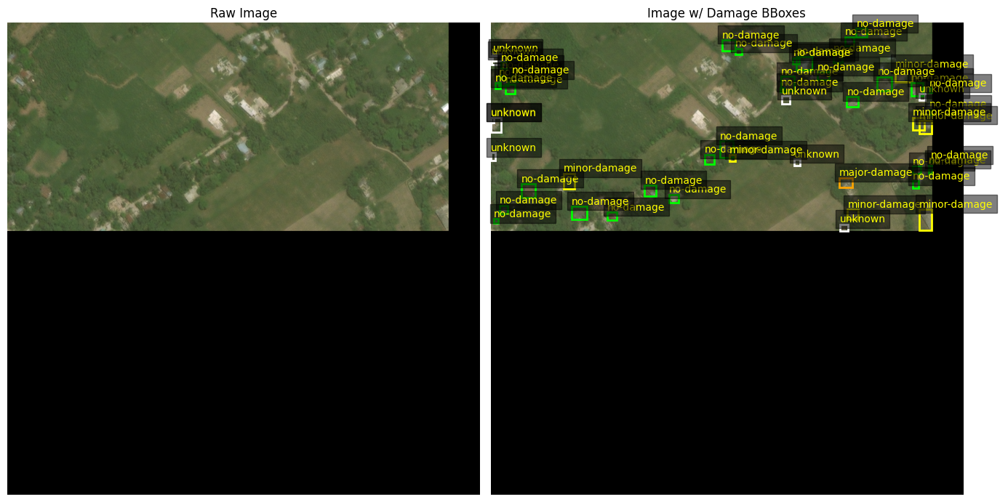


=== Batch 0, Sample 1 ===
Image shape: torch.Size([3, 1024, 1024])
Target keys: dict_keys(['boxes', 'labels', 'masks', 'image_id'])
# of bounding boxes = 1


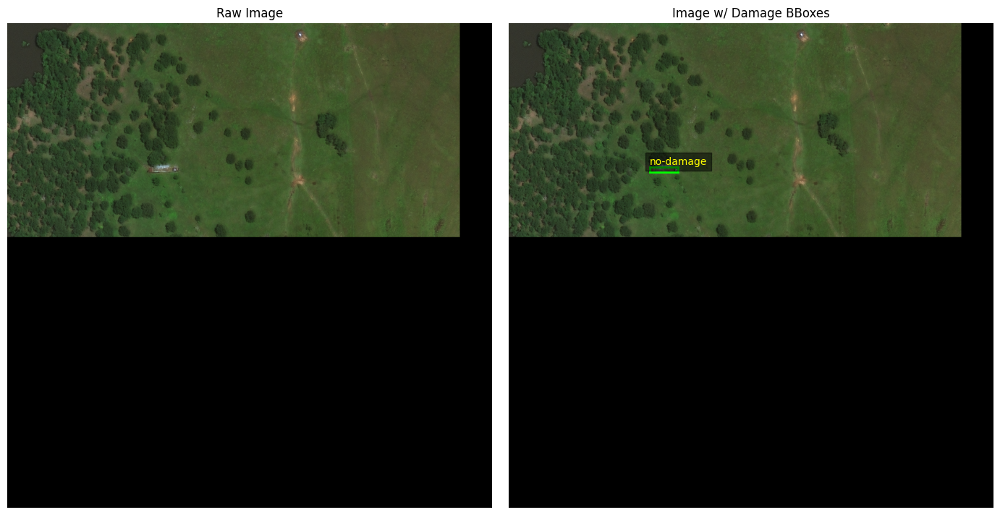


=== Batch 0, Sample 2 ===
Image shape: torch.Size([3, 1024, 1024])
Target keys: dict_keys(['boxes', 'labels', 'masks', 'image_id'])
# of bounding boxes = 5


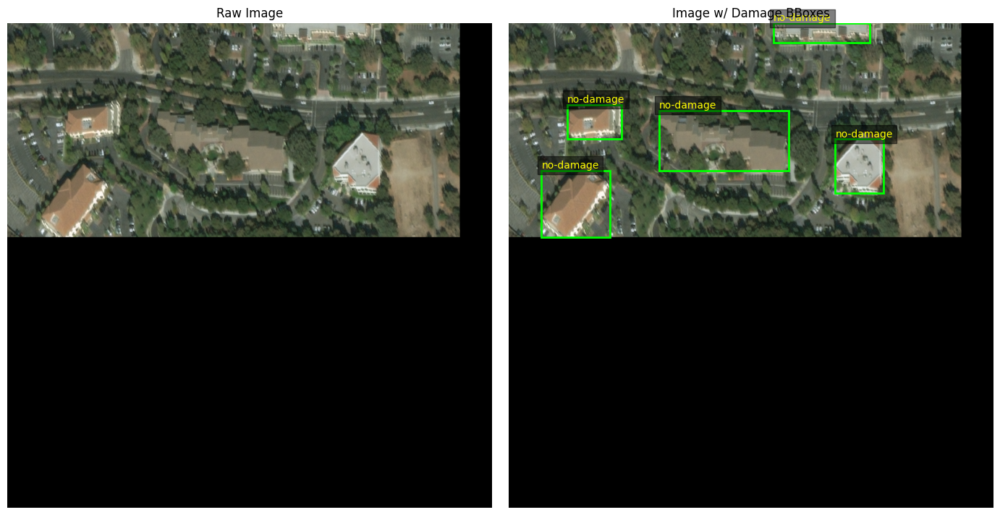


=== Batch 0, Sample 3 ===
Image shape: torch.Size([3, 1024, 1024])
Target keys: dict_keys(['boxes', 'labels', 'masks', 'image_id'])
# of bounding boxes = 0


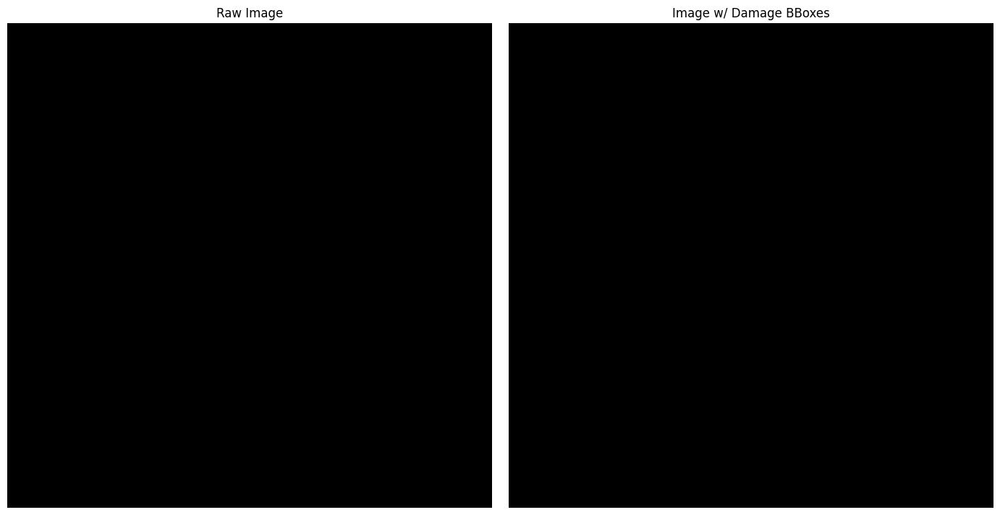

In [22]:
visualize_batch(train_loader_aug_bottom, batch_idx=0)


## MASK R-CNN

In [7]:
######################  model training  ####################################
def get_maskrcnn_model(num_classes=5, v2=False):
    # Load a Mask R-CNN model pre-trained on COCO
    if v2:
        model = maskrcnn_resnet50_fpn_v2(pretrained=True)
    else:
        model = maskrcnn_resnet50_fpn(pretrained=True)

    # Replace the bounding box predictor for the correct number of classes
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # Replace the mask predictor for the correct number of classes
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    model.roi_heads.mask_predictor = MaskRCNNPredictor(
        in_features_mask, hidden_layer, num_classes
    )

    return model

import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone

def get_model_instance_segmentation(num_classes):
    # Create a ResNet-101 backbone with FPN
    backbone = resnet_fpn_backbone('resnet101', pretrained=True)

    # Initialize Mask R-CNN with the new backbone
    model = torchvision.models.detection.MaskRCNN(backbone, num_classes=num_classes)

    # Replace the pre-trained head for the box predictor
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # Replace the mask predictor head
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    model.roi_heads.mask_predictor = MaskRCNNPredictor(
        in_features_mask,
        hidden_layer,
        num_classes
    )

    return model


In [ ]:
from tqdm import tqdm  # Import tqdm for progress bars

# Initialize the model
model = get_maskrcnn_model(num_classes=5)
model = model.cuda()  # Move to GPU if available
model.train()  # Set to training mode

# Define an optimizer
optimizer = optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)
num_epochs = 10

for epoch in range(num_epochs):
    # Create a progress bar for the batches
    epoch_bar = tqdm(combined_loader, desc=f"Epoch [{epoch+1}/{num_epochs}]", unit="batch")

    # Training loop
    for batch_idx, batch in enumerate(epoch_bar):
        # Unpack the batch
        imgs, targets = batch

        # Move images and targets to GPU if available
        imgs = [img.cuda() for img in imgs]
        targets = [
            {k: v.cuda() if torch.is_tensor(v) else v for k, v in t.items()}
            for t in targets
        ]

        # Forward pass through the model to compute losses
        losses_dict = model(imgs, targets)
        if isinstance(losses_dict, list):
            print(f"Unexpected list output at batch {batch_idx}: {losses_dict}")
            continue

        losses = sum(loss for loss in losses_dict.values())

        # Backpropagation and optimization
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        # Update the progress bar with the current loss
        epoch_bar.set_postfix({"Loss": losses.item()})

# Save the model after training
torch.save(model.state_dict(), "/kaggle/working/best_model_bottom.pth")
model.eval()  # Set model to evaluation mode


Epoch [1/10]:   0%|          | 0/1142 [00:00<?, ?batch/s]

Sample 298: 1 valid rect-aug boxes after filtering.
Sample 283: 2 valid rect-aug boxes after filtering.
Sample 773: 11 valid pre-disaster boxes after filtering.
Sample 773: 11 valid post-disaster boxes after filtering.
Sample 1445: 9 valid rect-aug boxes after filtering.
Sample 2044: 3 valid pre-disaster boxes after filtering.
Sample 2044: 3 valid post-disaster boxes after filtering.
Sample 918: 4 valid rect-aug boxes after filtering.
Sample 636: 5 valid pre-disaster boxes after filtering.
Sample 636: 5 valid post-disaster boxes after filtering.
Sample 1427: 95 valid pre-disaster boxes after filtering.
Sample 1427: 95 valid post-disaster boxes after filtering.
Sample 1220: 34 valid rect-aug boxes after filtering.
Sample 1451: 2 valid pre-disaster boxes after filtering.
Sample 1451: 2 valid post-disaster boxes after filtering.
Sample 411: 101 valid pre-disaster boxes after filtering.
Sample 411: 101 valid post-disaster boxes after filtering.
Sample 1962: 8 valid rect-aug boxes after fil

Epoch [1/10]:   0%|          | 1/1142 [00:07<2:19:50,  7.35s/batch, Loss=7.02]

Sample 876: 30 valid pre-disaster boxes after filtering.
Sample 876: 30 valid post-disaster boxes after filtering.
Sample 1371: 35 valid pre-disaster boxes after filtering.
Sample 1371: 35 valid post-disaster boxes after filtering.


Epoch [1/10]:   0%|          | 2/1142 [00:08<1:05:21,  3.44s/batch, Loss=2.25]

Sample 342: 43 valid pre-disaster boxes after filtering.
Sample 342: 43 valid post-disaster boxes after filtering.


Epoch [1/10]:   0%|          | 3/1142 [00:09<44:21,  2.34s/batch, Loss=2.48]  

Sample 1766: 4 valid rect-aug boxes after filtering.
Sample 1487: 5 valid pre-disaster boxes after filtering.
Sample 1487: 5 valid post-disaster boxes after filtering.
Sample 2003: 28 valid pre-disaster boxes after filtering.
Sample 2003: 28 valid post-disaster boxes after filtering.
Sample 736: 138 valid pre-disaster boxes after filtering.


Epoch [1/10]:   0%|          | 4/1142 [00:09<32:48,  1.73s/batch, Loss=1.71]

Sample 736: 138 valid post-disaster boxes after filtering.
Sample 1274: 13 valid rect-aug boxes after filtering.
Sample 1345: 37 valid pre-disaster boxes after filtering.
Sample 1345: 37 valid post-disaster boxes after filtering.
Sample 2276: 71 valid rect-aug boxes after filtering.
Sample 267: 17 valid pre-disaster boxes after filtering.
Sample 267: 17 valid post-disaster boxes after filtering.
Sample 1666: 53 valid pre-disaster boxes after filtering.
Sample 1666: 53 valid post-disaster boxes after filtering.


Epoch [1/10]:   0%|          | 5/1142 [00:11<34:35,  1.83s/batch, Loss=1.41]

Sample 808: 16 valid rect-aug boxes after filtering.
Sample 732: 2 valid pre-disaster boxes after filtering.Sample 2167: 6 valid pre-disaster boxes after filtering.


Sample 732: 2 valid post-disaster boxes after filtering.Sample 2167: 6 valid post-disaster boxes after filtering.
Sample 2092: 37 valid rect-aug boxes after filtering.


Epoch [1/10]:   1%|          | 6/1142 [00:13<31:23,  1.66s/batch, Loss=2.62]

Sample 1848: 1 valid rect-aug boxes after filtering.
Sample 1855: 53 valid rect-aug boxes after filtering.
Sample 869: 5 valid pre-disaster boxes after filtering.
Sample 869: 5 valid post-disaster boxes after filtering.
Sample 270: 44 valid pre-disaster boxes after filtering.
Sample 270: 44 valid post-disaster boxes after filtering.
Sample 1189: 15 valid rect-aug boxes after filtering.
Sample 1251: 2 valid pre-disaster boxes after filtering.
Sample 1251: 2 valid post-disaster boxes after filtering.


Epoch [1/10]:   1%|          | 7/1142 [00:14<28:27,  1.50s/batch, Loss=1.46]

Sample 1370: 35 valid pre-disaster boxes after filtering.
Sample 1370: 35 valid post-disaster boxes after filtering.


Epoch [1/10]:   1%|          | 8/1142 [00:15<25:17,  1.34s/batch, Loss=1.7] 

Sample 2209: 128 valid rect-aug boxes after filtering.
Sample 1843: 5 valid pre-disaster boxes after filtering.
Sample 547: 53 valid pre-disaster boxes after filtering.
Sample 1843: 5 valid post-disaster boxes after filtering.
Sample 547: 53 valid post-disaster boxes after filtering.


Epoch [1/10]:   1%|          | 9/1142 [00:16<22:36,  1.20s/batch, Loss=2.08]

Sample 449: 26 valid rect-aug boxes after filtering.
Sample 753: 38 valid pre-disaster boxes after filtering.Sample 240: Pre-Disaster MultiPolygon split into 2 Polygons.

Sample 753: 38 valid post-disaster boxes after filtering.
Sample 240: Post-Disaster MultiPolygon split into 2 Polygons.
Sample 240: 33 valid pre-disaster boxes after filtering.
Sample 240: 33 valid post-disaster boxes after filtering.
Sample 1162: 44 valid rect-aug boxes after filtering.


Epoch [1/10]:   1%|          | 10/1142 [00:17<22:25,  1.19s/batch, Loss=1.79]

Sample 1531: 9 valid pre-disaster boxes after filtering.
Sample 1531: 9 valid post-disaster boxes after filtering.
Sample 1716: 95 valid pre-disaster boxes after filtering.
Sample 1135: 72 valid pre-disaster boxes after filtering.


Epoch [1/10]:   1%|          | 11/1142 [00:18<21:12,  1.12s/batch, Loss=1.63]

Sample 1716: 95 valid post-disaster boxes after filtering.
Sample 1135: 72 valid post-disaster boxes after filtering.
Sample 207: Pre-Disaster MultiPolygon split into 2 Polygons.
Sample 207: Post-Disaster MultiPolygon split into 2 Polygons.
Sample 207: 220 valid pre-disaster boxes after filtering.
Sample 207: 220 valid post-disaster boxes after filtering.


Epoch [1/10]:   1%|          | 12/1142 [00:21<29:59,  1.59s/batch, Loss=1.98]

Sample 938: 3 valid rect-aug boxes after filtering.
Sample 481: 18 valid rect-aug boxes after filtering.
Sample 1486: 1 valid pre-disaster boxes after filtering.
Sample 1486: 1 valid post-disaster boxes after filtering.
Sample 2161: 13 valid rect-aug boxes after filtering.
Sample 1594: 5 valid pre-disaster boxes after filtering.
Sample 1594: 5 valid post-disaster boxes after filtering.


Epoch [1/10]:   1%|          | 13/1142 [00:22<26:27,  1.41s/batch, Loss=1.7] 

Sample 2147: 13 valid rect-aug boxes after filtering.
Sample 2269: 5 valid rect-aug boxes after filtering.
Sample 862: 20 valid rect-aug boxes after filtering.
Sample 1524: 1 valid pre-disaster boxes after filtering.
Sample 1524: 1 valid post-disaster boxes after filtering.
Sample 1917: 103 valid pre-disaster boxes after filtering.
Sample 830: 91 valid pre-disaster boxes after filtering.
Sample 1917: 103 valid post-disaster boxes after filtering.
Sample 830: 91 valid post-disaster boxes after filtering.


Epoch [1/10]:   1%|▏         | 15/1142 [00:25<28:59,  1.54s/batch, Loss=2.3] 

Sample 1338: 2 valid pre-disaster boxes after filtering.
Sample 1338: 2 valid post-disaster boxes after filtering.
Sample 824: 3 valid pre-disaster boxes after filtering.
Sample 824: 3 valid post-disaster boxes after filtering.
Sample 158: 1 valid pre-disaster boxes after filtering.
Sample 158: 1 valid post-disaster boxes after filtering.Sample 413: 37 valid rect-aug boxes after filtering.

Sample 382: 90 valid rect-aug boxes after filtering.
Sample 1687: 16 valid pre-disaster boxes after filtering.
Sample 1687: 16 valid post-disaster boxes after filtering.
Sample 1340: 9 valid pre-disaster boxes after filtering.
Sample 1340: 9 valid post-disaster boxes after filtering.
Sample 898: 114 valid rect-aug boxes after filtering.
Sample 165: 6 valid pre-disaster boxes after filtering.
Sample 165: 6 valid post-disaster boxes after filtering.
Sample 43: 38 valid pre-disaster boxes after filtering.
Sample 43: 38 valid post-disaster boxes after filtering.
Sample 2148: Unsupported geometry type af

Epoch [1/10]:   1%|▏         | 16/1142 [00:31<51:46,  2.76s/batch, Loss=2.36]

Sample 221: 3 valid pre-disaster boxes after filtering.
Sample 221: 3 valid post-disaster boxes after filtering.
Sample 398: 76 valid rect-aug boxes after filtering.


Epoch [1/10]:   1%|▏         | 17/1142 [00:32<41:25,  2.21s/batch, Loss=1.96]

Sample 155: 293 valid pre-disaster boxes after filtering.
Sample 155: 293 valid post-disaster boxes after filtering.
Sample 1164: 35 valid pre-disaster boxes after filtering.
Sample 1164: 35 valid post-disaster boxes after filtering.


Epoch [1/10]:   2%|▏         | 18/1142 [00:33<34:24,  1.84s/batch, Loss=1.82]

Sample 430: 1 valid pre-disaster boxes after filtering.
Sample 430: 1 valid post-disaster boxes after filtering.
Sample 1461: 16 valid pre-disaster boxes after filtering.
Sample 1461: 16 valid post-disaster boxes after filtering.
Sample 1837: 63 valid rect-aug boxes after filtering.


Epoch [1/10]:   2%|▏         | 19/1142 [00:34<30:03,  1.61s/batch, Loss=1.26]

Sample 469: 12 valid pre-disaster boxes after filtering.
Sample 469: 12 valid post-disaster boxes after filtering.
Sample 1122: 5 valid pre-disaster boxes after filtering.
Sample 1122: 5 valid post-disaster boxes after filtering.


Epoch [1/10]:   2%|▏         | 20/1142 [00:35<26:05,  1.39s/batch, Loss=2.19]

Sample 1468: 55 valid rect-aug boxes after filtering.
Sample 235: 22 valid rect-aug boxes after filtering.
Sample 966: 129 valid pre-disaster boxes after filtering.
Sample 966: 129 valid post-disaster boxes after filtering.


Epoch [1/10]:   2%|▏         | 21/1142 [00:35<22:05,  1.18s/batch, Loss=1.57]

Sample 662: 44 valid pre-disaster boxes after filtering.
Sample 662: 44 valid post-disaster boxes after filtering.


Epoch [1/10]:   2%|▏         | 22/1142 [00:36<20:40,  1.11s/batch, Loss=1.57]

Sample 60: 4 valid pre-disaster boxes after filtering.
Sample 60: 4 valid post-disaster boxes after filtering.
Sample 781: 30 valid rect-aug boxes after filtering.
Sample 1956: 6 valid pre-disaster boxes after filtering.
Sample 1956: 6 valid post-disaster boxes after filtering.


Epoch [1/10]:   2%|▏         | 23/1142 [00:37<20:24,  1.09s/batch, Loss=0.853]

Sample 360: 14 valid pre-disaster boxes after filtering.
Sample 360: 14 valid post-disaster boxes after filtering.
Sample 104: 4 valid pre-disaster boxes after filtering.
Sample 104: 4 valid post-disaster boxes after filtering.


Epoch [1/10]:   2%|▏         | 24/1142 [00:38<18:58,  1.02s/batch, Loss=1.87] 

Sample 1086: Pre-Disaster MultiPolygon split into 2 Polygons.
Sample 1086: Post-Disaster MultiPolygon split into 2 Polygons.
Sample 1086: 83 valid pre-disaster boxes after filtering.
Sample 1086: 83 valid post-disaster boxes after filtering.
Sample 598: 13 valid pre-disaster boxes after filtering.
Sample 598: 13 valid post-disaster boxes after filtering.
Sample 2051: 3 valid pre-disaster boxes after filtering.
Sample 2051: 3 valid post-disaster boxes after filtering.
Sample 251: 4 valid rect-aug boxes after filtering.
Sample 461: 1 valid rect-aug boxes after filtering.
Sample 1576: 8 valid rect-aug boxes after filtering.
Sample 899: 13 valid rect-aug boxes after filtering.
Sample 707: 24 valid pre-disaster boxes after filtering.
Sample 707: 24 valid post-disaster boxes after filtering.
Sample 622: 154 valid rect-aug boxes after filtering.
Sample 1166: 260 valid rect-aug boxes after filtering.
Sample 2088: 2 valid pre-disaster boxes after filtering.
Sample 2088: 2 valid post-disaster bo

Epoch [1/10]:   2%|▏         | 25/1142 [00:44<45:54,  2.47s/batch, Loss=1.8] 

Sample 932: 53 valid rect-aug boxes after filtering.
Sample 890: 11 valid rect-aug boxes after filtering.
Sample 1744: 247 valid rect-aug boxes after filtering.
Sample 343: 6 valid rect-aug boxes after filtering.
Sample 1596: 6 valid rect-aug boxes after filtering.
Sample 1755: 6 valid pre-disaster boxes after filtering.
Sample 1755: 6 valid post-disaster boxes after filtering.


Epoch [1/10]:   2%|▏         | 26/1142 [00:45<39:15,  2.11s/batch, Loss=1.71]

Sample 116: 3 valid rect-aug boxes after filtering.
Sample 0: 16 valid rect-aug boxes after filtering.
Sample 995: 1 valid pre-disaster boxes after filtering.
Sample 995: 1 valid post-disaster boxes after filtering.
Sample 1990: 1 valid rect-aug boxes after filtering.


Epoch [1/10]:   2%|▏         | 27/1142 [00:46<31:49,  1.71s/batch, Loss=1.59]

Sample 886: 8 valid pre-disaster boxes after filtering.
Sample 886: 8 valid post-disaster boxes after filtering.
Sample 1916: 5 valid rect-aug boxes after filtering.
Sample 1784: Pre-Disaster MultiPolygon split into 2 Polygons.
Sample 1784: Post-Disaster MultiPolygon split into 2 Polygons.
Sample 1784: 10 valid pre-disaster boxes after filtering.
Sample 1784: 10 valid post-disaster boxes after filtering.
Sample 1064: Pre-Disaster MultiPolygon split into 3 Polygons.
Sample 1064: Post-Disaster MultiPolygon split into 3 Polygons.


Epoch [1/10]:   2%|▏         | 28/1142 [00:47<26:53,  1.45s/batch, Loss=2]   

Sample 1064: 47 valid pre-disaster boxes after filtering.
Sample 1064: 47 valid post-disaster boxes after filtering.
Sample 919: 11 valid rect-aug boxes after filtering.


Epoch [1/10]:   3%|▎         | 29/1142 [00:48<24:19,  1.31s/batch, Loss=2.26]

Sample 453: Pre-Disaster MultiPolygon split into 2 Polygons.
Sample 453: Post-Disaster MultiPolygon split into 2 Polygons.
Sample 453: 60 valid pre-disaster boxes after filtering.
Sample 453: 60 valid post-disaster boxes after filtering.
Sample 1954: 28 valid pre-disaster boxes after filtering.
Sample 1954: 28 valid post-disaster boxes after filtering.


Epoch [1/10]:   3%|▎         | 30/1142 [00:49<22:46,  1.23s/batch, Loss=1.25]

Sample 135: 6 valid rect-aug boxes after filtering.
Sample 1963: 1 valid rect-aug boxes after filtering.
Sample 1876: 10 valid rect-aug boxes after filtering.
Sample 821: 14 valid rect-aug boxes after filtering.
Sample 228: 3 valid pre-disaster boxes after filtering.
Sample 228: 3 valid post-disaster boxes after filtering.


Epoch [1/10]:   3%|▎         | 31/1142 [00:50<20:52,  1.13s/batch, Loss=1.45]

Sample 1119: 17 valid rect-aug boxes after filtering.
Sample 383: 3 valid rect-aug boxes after filtering.
Sample 1095: 58 valid rect-aug boxes after filtering.


Epoch [1/10]:   3%|▎         | 32/1142 [00:51<19:13,  1.04s/batch, Loss=1.22]

Sample 2134: 409 valid rect-aug boxes after filtering.
Sample 1499: 86 valid rect-aug boxes after filtering.


Epoch [1/10]:   3%|▎         | 33/1142 [00:51<17:16,  1.07batch/s, Loss=1.25]

Sample 1696: 145 valid rect-aug boxes after filtering.
Sample 1288: 6 valid pre-disaster boxes after filtering.
Sample 1288: 6 valid post-disaster boxes after filtering.
Sample 477: 7 valid pre-disaster boxes after filtering.
Sample 477: 7 valid post-disaster boxes after filtering.
Sample 1248: 20 valid rect-aug boxes after filtering.


Epoch [1/10]:   3%|▎         | 34/1142 [00:52<15:12,  1.21batch/s, Loss=1.81]

Sample 1991: 2 valid pre-disaster boxes after filtering.
Sample 1991: 2 valid post-disaster boxes after filtering.
Sample 1680: 51 valid rect-aug boxes after filtering.
Sample 702: 13 valid rect-aug boxes after filtering.

Epoch [1/10]:   3%|▎         | 34/1142 [00:53<15:12,  1.21batch/s, Loss=1.21]

Epoch [1/10]:   3%|▎         | 35/1142 [00:53<14:36,  1.26batch/s, Loss=1.21]

Sample 2097: 11 valid pre-disaster boxes after filtering.
Sample 2097: 11 valid post-disaster boxes after filtering.
Sample 2197: 33 valid rect-aug boxes after filtering.
Sample 794: 28 valid pre-disaster boxes after filtering.
Sample 2091: 16 valid pre-disaster boxes after filtering.
Sample 794: 28 valid post-disaster boxes after filtering.
Sample 2091: 16 valid post-disaster boxes after filtering.
Sample 986: 14 valid pre-disaster boxes after filtering.
Sample 986: 14 valid post-disaster boxes after filtering.


Epoch [1/10]:   3%|▎         | 36/1142 [00:54<16:31,  1.12batch/s, Loss=1.72]

Sample 2198: 4 valid rect-aug boxes after filtering.
Sample 881: 1 valid pre-disaster boxes after filtering.
Sample 881: 1 valid post-disaster boxes after filtering.
Sample 286: 21 valid pre-disaster boxes after filtering.
Sample 286: 21 valid post-disaster boxes after filtering.
Sample 2093: 12 valid pre-disaster boxes after filtering.
Sample 2093: 12 valid post-disaster boxes after filtering.
Sample 130: 40 valid rect-aug boxes after filtering.


Epoch [1/10]:   3%|▎         | 37/1142 [00:55<16:14,  1.13batch/s, Loss=1.27]

Sample 203: 7 valid pre-disaster boxes after filtering.
Sample 203: 7 valid post-disaster boxes after filtering.
Sample 1103: 4 valid rect-aug boxes after filtering.
Sample 1321: 12 valid rect-aug boxes after filtering.
Sample 59: 135 valid rect-aug boxes after filtering.


Epoch [1/10]:   3%|▎         | 38/1142 [00:56<17:11,  1.07batch/s, Loss=1.55]

Sample 965: 93 valid pre-disaster boxes after filtering.
Sample 965: 93 valid post-disaster boxes after filtering.
Sample 2131: 10 valid pre-disaster boxes after filtering.
Sample 2131: 10 valid post-disaster boxes after filtering.


Epoch [1/10]:   3%|▎         | 39/1142 [00:56<16:11,  1.14batch/s, Loss=1.95]

Sample 452: 8 valid rect-aug boxes after filtering.
Sample 86: 28 valid rect-aug boxes after filtering.
Sample 1845: 33 valid rect-aug boxes after filtering.
Sample 1096: 3 valid rect-aug boxes after filtering.


Epoch [1/10]:   4%|▎         | 40/1142 [00:57<15:22,  1.20batch/s, Loss=1.92]

Sample 1051: 9 valid pre-disaster boxes after filtering.
Sample 1051: 9 valid post-disaster boxes after filtering.
Sample 695: 127 valid pre-disaster boxes after filtering.
Sample 253: 10 valid rect-aug boxes after filtering.
Sample 695: 127 valid post-disaster boxes after filtering.
Sample 14: 43 valid pre-disaster boxes after filtering.


Epoch [1/10]:   4%|▎         | 41/1142 [00:58<15:44,  1.17batch/s, Loss=1.61]

Sample 14: 43 valid post-disaster boxes after filtering.


Epoch [1/10]:   4%|▎         | 42/1142 [00:59<16:36,  1.10batch/s, Loss=1.97]

Sample 579: Pre-Disaster MultiPolygon split into 2 Polygons.
Sample 579: Post-Disaster MultiPolygon split into 2 Polygons.
Sample 579: 86 valid pre-disaster boxes after filtering.
Sample 1751: 79 valid rect-aug boxes after filtering.
Sample 579: 86 valid post-disaster boxes after filtering.


Epoch [1/10]:   4%|▍         | 43/1142 [01:00<16:24,  1.12batch/s, Loss=1.45]

Sample 2014: Pre-Disaster MultiPolygon split into 2 Polygons.
Sample 2014: Post-Disaster MultiPolygon split into 2 Polygons.


Epoch [1/10]:   4%|▍         | 44/1142 [01:01<15:55,  1.15batch/s, Loss=1.77]

Sample 2014: 217 valid pre-disaster boxes after filtering.
Sample 153: 34 valid rect-aug boxes after filtering.
Sample 2014: 218 valid post-disaster boxes after filtering.


Epoch [1/10]:   4%|▍         | 45/1142 [01:01<15:23,  1.19batch/s, Loss=1.78]

Sample 530: 1 valid rect-aug boxes after filtering.
Sample 10: 4 valid rect-aug boxes after filtering.
Sample 1368: 1 valid rect-aug boxes after filtering.
Sample 412: 15 valid rect-aug boxes after filtering.
Sample 249: 13 valid rect-aug boxes after filtering.
Sample 2177: 5 valid rect-aug boxes after filtering.
Sample 558: 403 valid pre-disaster boxes after filtering.
Sample 725: Pre-Disaster MultiPolygon split into 2 Polygons.
Sample 725: Pre-Disaster MultiPolygon split into 2 Polygons.
Sample 725: Post-Disaster MultiPolygon split into 2 Polygons.
Sample 725: Post-Disaster MultiPolygon split into 2 Polygons.
Sample 558: 403 valid post-disaster boxes after filtering.
Sample 725: 114 valid pre-disaster boxes after filtering.
Sample 725: 114 valid post-disaster boxes after filtering.


Epoch [1/10]:   4%|▍         | 47/1142 [01:06<26:35,  1.46s/batch, Loss=1.42]

Sample 954: 68 valid pre-disaster boxes after filtering.


Epoch [1/10]:   4%|▍         | 48/1142 [01:07<23:37,  1.30s/batch, Loss=1.5] 

Sample 954: 68 valid post-disaster boxes after filtering.
Sample 926: 3 valid rect-aug boxes after filtering.


Epoch [1/10]:   4%|▍         | 49/1142 [01:08<22:00,  1.21s/batch, Loss=1.59]

Sample 1834: 13 valid rect-aug boxes after filtering.
Sample 316: 7 valid rect-aug boxes after filtering.Sample 163: 21 valid pre-disaster boxes after filtering.

Sample 163: 21 valid post-disaster boxes after filtering.
Sample 1415: 3 valid pre-disaster boxes after filtering.
Sample 1415: 3 valid post-disaster boxes after filtering.


Epoch [1/10]:   4%|▍         | 50/1142 [01:09<23:20,  1.28s/batch, Loss=1.66]

Sample 41: 32 valid pre-disaster boxes after filtering.
Sample 41: 32 valid post-disaster boxes after filtering.
Sample 2029: 28 valid pre-disaster boxes after filtering.
Sample 2029: 28 valid post-disaster boxes after filtering.
Sample 1397: 4 valid pre-disaster boxes after filtering.
Sample 1397: 4 valid post-disaster boxes after filtering.
Sample 1535: Pre-Disaster MultiPolygon split into 3 Polygons.
Sample 1535: Post-Disaster MultiPolygon split into 3 Polygons.
Sample 1535: 16 valid pre-disaster boxes after filtering.
Sample 1535: 16 valid post-disaster boxes after filtering.
Sample 1643: 36 valid pre-disaster boxes after filtering.
Sample 1643: 36 valid post-disaster boxes after filtering.
Sample 1207: 2 valid pre-disaster boxes after filtering.
Sample 1207: 2 valid post-disaster boxes after filtering.
Sample 1163: 2 valid rect-aug boxes after filtering.
Sample 1671: 3 valid pre-disaster boxes after filtering.
Sample 1671: 3 valid post-disaster boxes after filtering.
Sample 1920: 

Epoch [1/10]:   4%|▍         | 51/1142 [01:13<37:53,  2.08s/batch, Loss=2.52]

Sample 1622: 76 valid pre-disaster boxes after filtering.
Sample 1622: 76 valid post-disaster boxes after filtering.
Sample 1023: 5 valid pre-disaster boxes after filtering.
Sample 1023: 5 valid post-disaster boxes after filtering.
Sample 172: 9 valid pre-disaster boxes after filtering.
Sample 172: 9 valid post-disaster boxes after filtering.


Epoch [1/10]:   5%|▍         | 52/1142 [01:14<31:17,  1.72s/batch, Loss=1.3] 

Sample 1830: 55 valid rect-aug boxes after filtering.
Sample 609: 8 valid rect-aug boxes after filtering.
Sample 1016: 3 valid rect-aug boxes after filtering.
Sample 870: 15 valid rect-aug boxes after filtering.
Sample 1203: 20 valid rect-aug boxes after filtering.
Sample 1682: 14 valid pre-disaster boxes after filtering.
Sample 1682: 14 valid post-disaster boxes after filtering.
Sample 1087: 41 valid pre-disaster boxes after filtering.
Sample 1087: 41 valid post-disaster boxes after filtering.


Epoch [1/10]:   5%|▍         | 53/1142 [01:19<45:59,  2.53s/batch, Loss=1.29]

Sample 400: 1 valid rect-aug boxes after filtering.
Sample 980: 19 valid rect-aug boxes after filtering.
Sample 859: 7 valid rect-aug boxes after filtering.
Sample 632: 31 valid rect-aug boxes after filtering.
Sample 240: 20 valid rect-aug boxes after filtering.
Sample 801: 2 valid rect-aug boxes after filtering.


Epoch [1/10]:   5%|▍         | 54/1142 [01:20<37:13,  2.05s/batch, Loss=1.78]

Sample 1011: 8 valid rect-aug boxes after filtering.
Sample 843: 22 valid pre-disaster boxes after filtering.
Sample 843: 22 valid post-disaster boxes after filtering.


Epoch [1/10]:   5%|▍         | 55/1142 [01:20<29:41,  1.64s/batch, Loss=1.2] 

Sample 519: 88 valid rect-aug boxes after filtering.
Sample 540: 2 valid pre-disaster boxes after filtering.
Sample 540: 2 valid post-disaster boxes after filtering.
Sample 2275: 6 valid rect-aug boxes after filtering.
Sample 1522: 9 valid rect-aug boxes after filtering.
Sample 1614: 17 valid pre-disaster boxes after filtering.
Sample 1614: 17 valid post-disaster boxes after filtering.
Sample 1013: 15 valid pre-disaster boxes after filtering.
Sample 1013: 15 valid post-disaster boxes after filtering.


Epoch [1/10]:   5%|▍         | 56/1142 [01:21<25:43,  1.42s/batch, Loss=1.42]

Sample 98: 6 valid pre-disaster boxes after filtering.
Sample 98: 6 valid post-disaster boxes after filtering.
Sample 1965: 1 valid pre-disaster boxes after filtering.
Sample 1965: 1 valid post-disaster boxes after filtering.
Sample 2243: 7 valid pre-disaster boxes after filtering.
Sample 2243: 7 valid post-disaster boxes after filtering.


Epoch [1/10]:   5%|▍         | 57/1142 [01:22<22:47,  1.26s/batch, Loss=1.49]

Sample 422: 1 valid pre-disaster boxes after filtering.
Sample 422: 1 valid post-disaster boxes after filtering.
Sample 706: 4 valid pre-disaster boxes after filtering.
Sample 706: 4 valid post-disaster boxes after filtering.
Sample 2257: 9 valid pre-disaster boxes after filtering.
Sample 2257: 9 valid post-disaster boxes after filtering.


Epoch [1/10]:   5%|▌         | 58/1142 [01:23<21:06,  1.17s/batch, Loss=1.66]

Sample 209: 4 valid pre-disaster boxes after filtering.
Sample 209: 4 valid post-disaster boxes after filtering.
Sample 1424: 30 valid rect-aug boxes after filtering.


Epoch [1/10]:   5%|▌         | 59/1142 [01:24<19:19,  1.07s/batch, Loss=1.46]

Sample 1794: 13 valid pre-disaster boxes after filtering.
Sample 1794: 13 valid post-disaster boxes after filtering.
Sample 1621: 14 valid rect-aug boxes after filtering.
Sample 1317: 43 valid pre-disaster boxes after filtering.
Sample 1317: 43 valid post-disaster boxes after filtering.


Epoch [1/10]:   5%|▌         | 60/1142 [01:25<18:03,  1.00s/batch, Loss=1.73]

Sample 982: 24 valid pre-disaster boxes after filtering.
Sample 982: 24 valid post-disaster boxes after filtering.
Sample 1391: 1 valid rect-aug boxes after filtering.
Sample 1206: 57 valid rect-aug boxes after filtering.


Epoch [1/10]:   5%|▌         | 61/1142 [01:25<16:50,  1.07batch/s, Loss=1.81]

Sample 371: 106 valid rect-aug boxes after filtering.
Sample 501: 20 valid pre-disaster boxes after filtering.
Sample 501: 20 valid post-disaster boxes after filtering.
Sample 173: 7 valid pre-disaster boxes after filtering.
Sample 173: 7 valid post-disaster boxes after filtering.


Epoch [1/10]:   5%|▌         | 62/1142 [01:26<15:48,  1.14batch/s, Loss=1.85]

Sample 720: 14 valid pre-disaster boxes after filtering.
Sample 720: 14 valid post-disaster boxes after filtering.
Sample 1292: 17 valid pre-disaster boxes after filtering.
Sample 1292: 17 valid post-disaster boxes after filtering.


Epoch [1/10]:   6%|▌         | 63/1142 [01:27<15:02,  1.20batch/s, Loss=1.57]

Sample 566: 85 valid rect-aug boxes after filtering.
Sample 1996: 101 valid rect-aug boxes after filtering.


Epoch [1/10]:   6%|▌         | 64/1142 [01:28<14:57,  1.20batch/s, Loss=1.52]

Sample 1911: 40 valid pre-disaster boxes after filtering.
Sample 1911: 40 valid post-disaster boxes after filtering.
Sample 1590: 2 valid pre-disaster boxes after filtering.
Sample 1590: 2 valid post-disaster boxes after filtering.
Sample 1492: 12 valid rect-aug boxes after filtering.
Sample 813: 4 valid rect-aug boxes after filtering.
Sample 4: 1 valid pre-disaster boxes after filtering.
Sample 4: 1 valid post-disaster boxes after filtering.


Epoch [1/10]:   6%|▌         | 65/1142 [01:29<15:37,  1.15batch/s, Loss=1.36]

Sample 1308: 2 valid pre-disaster boxes after filtering.
Sample 1308: 2 valid post-disaster boxes after filtering.
Sample 12: 2 valid pre-disaster boxes after filtering.
Sample 12: 2 valid post-disaster boxes after filtering.
Sample 2269: 6 valid pre-disaster boxes after filtering.
Sample 2269: 6 valid post-disaster boxes after filtering.
Sample 1609: 1 valid pre-disaster boxes after filtering.
Sample 1609: 1 valid post-disaster boxes after filtering.


Epoch [1/10]:   6%|▌         | 66/1142 [01:30<16:03,  1.12batch/s, Loss=1.06]

Sample 994: 100 valid rect-aug boxes after filtering.
Sample 1430: 10 valid pre-disaster boxes after filtering.
Sample 1430: 10 valid post-disaster boxes after filtering.
Sample 216: 84 valid rect-aug boxes after filtering.
Sample 1405: 12 valid rect-aug boxes after filtering.


Epoch [1/10]:   6%|▌         | 67/1142 [01:31<16:10,  1.11batch/s, Loss=1.56]

Sample 1443: 6 valid pre-disaster boxes after filtering.
Sample 1443: 6 valid post-disaster boxes after filtering.
Sample 98: 15 valid rect-aug boxes after filtering.
Sample 117: 86 valid pre-disaster boxes after filtering.
Sample 117: 86 valid post-disaster boxes after filtering.


Epoch [1/10]:   6%|▌         | 68/1142 [01:32<16:19,  1.10batch/s, Loss=1.39]

Sample 2008: 4 valid rect-aug boxes after filtering.
Sample 588: Pre-Disaster MultiPolygon split into 2 Polygons.
Sample 588: Pre-Disaster MultiPolygon split into 2 Polygons.
Sample 588: Post-Disaster MultiPolygon split into 2 Polygons.
Sample 588: Post-Disaster MultiPolygon split into 2 Polygons.


Epoch [1/10]:   6%|▌         | 69/1142 [01:32<15:46,  1.13batch/s, Loss=1.99]

Sample 588: 134 valid pre-disaster boxes after filtering.
Sample 588: 134 valid post-disaster boxes after filtering.
Sample 349: 39 valid rect-aug boxes after filtering.
Sample 1984: 52 valid rect-aug boxes after filtering.


Epoch [1/10]:   6%|▌         | 70/1142 [01:33<15:54,  1.12batch/s, Loss=1.8] 

Sample 986: 8 valid rect-aug boxes after filtering.
Sample 1504: 134 valid rect-aug boxes after filtering.
Sample 806: 14 valid pre-disaster boxes after filtering.
Sample 806: 14 valid post-disaster boxes after filtering.
Sample 1936: 12 valid pre-disaster boxes after filtering.
Sample 867: 1 valid pre-disaster boxes after filtering.
Sample 867: 1 valid post-disaster boxes after filtering.
Sample 1936: 12 valid post-disaster boxes after filtering.


Epoch [1/10]:   6%|▌         | 71/1142 [01:34<16:24,  1.09batch/s, Loss=1.62]

Sample 731: 5 valid pre-disaster boxes after filtering.
Sample 731: 5 valid post-disaster boxes after filtering.


Epoch [1/10]:   6%|▋         | 72/1142 [01:35<16:04,  1.11batch/s, Loss=1]   

Sample 1618: 81 valid pre-disaster boxes after filtering.
Sample 1360: 9 valid pre-disaster boxes after filtering.
Sample 1360: 9 valid post-disaster boxes after filtering.
Sample 1618: 81 valid post-disaster boxes after filtering.


Epoch [1/10]:   6%|▋         | 73/1142 [01:36<15:22,  1.16batch/s, Loss=2.38]

Sample 1027: 3 valid pre-disaster boxes after filtering.
Sample 1027: 3 valid post-disaster boxes after filtering.
Sample 1215: 3 valid rect-aug boxes after filtering.


Epoch [1/10]:   6%|▋         | 74/1142 [01:37<15:37,  1.14batch/s, Loss=1.7] 

Sample 1300: Pre-Disaster MultiPolygon split into 3 Polygons.
Sample 1762: 29 valid pre-disaster boxes after filtering.
Sample 1762: 29 valid post-disaster boxes after filtering.
Sample 941: 14 valid pre-disaster boxes after filtering.
Sample 941: 14 valid post-disaster boxes after filtering.
Sample 1300: Post-Disaster MultiPolygon split into 3 Polygons.


Epoch [1/10]:   7%|▋         | 75/1142 [01:38<15:08,  1.17batch/s, Loss=1.73]

Sample 1300: 162 valid pre-disaster boxes after filtering.
Sample 1300: 162 valid post-disaster boxes after filtering.
Sample 2017: 13 valid rect-aug boxes after filtering.
Sample 1243: 20 valid rect-aug boxes after filtering.
Sample 1852: 1 valid pre-disaster boxes after filtering.
Sample 1852: 1 valid post-disaster boxes after filtering.
Sample 1541: 49 valid rect-aug boxes after filtering.


Epoch [1/10]:   7%|▋         | 76/1142 [01:39<16:10,  1.10batch/s, Loss=1.73]

Sample 1899: 43 valid rect-aug boxes after filtering.
Sample 390: 40 valid rect-aug boxes after filtering.
Sample 1996: 99 valid pre-disaster boxes after filtering.
Sample 1996: 99 valid post-disaster boxes after filtering.
Sample 981: 3 valid pre-disaster boxes after filtering.
Sample 981: 3 valid post-disaster boxes after filtering.
Sample 103: 57 valid rect-aug boxes after filtering.
Sample 2260: 133 valid rect-aug boxes after filtering.
Sample 1026: 19 valid rect-aug boxes after filtering.


Epoch [1/10]:   7%|▋         | 77/1142 [01:40<20:36,  1.16s/batch, Loss=1.43]

Sample 1442: Pre-Disaster MultiPolygon split into 2 Polygons.
Sample 1442: Post-Disaster MultiPolygon split into 2 Polygons.
Sample 1442: 26 valid pre-disaster boxes after filtering.
Sample 1442: 26 valid post-disaster boxes after filtering.
Sample 1939: 2 valid pre-disaster boxes after filtering.
Sample 1939: 2 valid post-disaster boxes after filtering.
Sample 175: 37 valid pre-disaster boxes after filtering.
Sample 175: 37 valid post-disaster boxes after filtering.


Epoch [1/10]:   7%|▋         | 78/1142 [01:41<20:03,  1.13s/batch, Loss=2.51]

Sample 110: 61 valid pre-disaster boxes after filtering.
Sample 110: 61 valid post-disaster boxes after filtering.


Epoch [1/10]:   7%|▋         | 79/1142 [01:43<19:56,  1.13s/batch, Loss=0.939]

Sample 1510: 2 valid pre-disaster boxes after filtering.
Sample 1510: 2 valid post-disaster boxes after filtering.


Epoch [1/10]:   7%|▋         | 80/1142 [01:43<18:39,  1.05s/batch, Loss=2.12] 

Sample 2050: 8 valid pre-disaster boxes after filtering.
Sample 2050: 8 valid post-disaster boxes after filtering.
Sample 427: 28 valid rect-aug boxes after filtering.
Sample 690: 41 valid rect-aug boxes after filtering.


Epoch [1/10]:   7%|▋         | 81/1142 [01:44<18:04,  1.02s/batch, Loss=1.76]

Sample 2196: 3 valid rect-aug boxes after filtering.
Sample 324: 11 valid rect-aug boxes after filtering.
Sample 889: 1 valid pre-disaster boxes after filtering.
Sample 889: 1 valid post-disaster boxes after filtering.
Sample 810: 12 valid pre-disaster boxes after filtering.
Sample 810: 12 valid post-disaster boxes after filtering.
Sample 2035: 54 valid pre-disaster boxes after filtering.
Sample 2035: 54 valid post-disaster boxes after filtering.Sample 2051: 4 valid rect-aug boxes after filtering.

Sample 1520: 13 valid pre-disaster boxes after filtering.
Sample 1520: 13 valid post-disaster boxes after filtering.
Sample 601: 18 valid rect-aug boxes after filtering.
Sample 838: 54 valid rect-aug boxes after filtering.


Epoch [1/10]:   7%|▋         | 82/1142 [01:46<21:18,  1.21s/batch, Loss=1.53]

Sample 197: 222 valid rect-aug boxes after filtering.
Sample 666: 19 valid rect-aug boxes after filtering.
Sample 1652: 9 valid pre-disaster boxes after filtering.
Sample 1652: 9 valid post-disaster boxes after filtering.


Epoch [1/10]:   7%|▋         | 83/1142 [01:47<21:18,  1.21s/batch, Loss=1.69]

Sample 1476: 16 valid pre-disaster boxes after filtering.
Sample 1476: 16 valid post-disaster boxes after filtering.
Sample 1854: 4 valid pre-disaster boxes after filtering.
Sample 1854: 4 valid post-disaster boxes after filtering.
Sample 1342: 7 valid pre-disaster boxes after filtering.
Sample 1342: 7 valid post-disaster boxes after filtering.
Sample 1959: 11 valid rect-aug boxes after filtering.
Sample 1339: 1 valid pre-disaster boxes after filtering.
Sample 1339: 1 valid post-disaster boxes after filtering.
Sample 578: 64 valid rect-aug boxes after filtering.
Sample 289: 6 valid rect-aug boxes after filtering.


Epoch [1/10]:   7%|▋         | 84/1142 [01:48<20:07,  1.14s/batch, Loss=1.83]

Sample 548: 1 valid pre-disaster boxes after filtering.
Sample 548: 1 valid post-disaster boxes after filtering.
Sample 1776: 32 valid rect-aug boxes after filtering.
Sample 924: 219 valid rect-aug boxes after filtering.
Sample 2002: 25 valid rect-aug boxes after filtering.
Sample 1246: 2 valid rect-aug boxes after filtering.


Epoch [1/10]:   7%|▋         | 85/1142 [01:49<19:07,  1.09s/batch, Loss=1.04]

Sample 1429: 4 valid rect-aug boxes after filtering.
Sample 546: 43 valid pre-disaster boxes after filtering.
Sample 546: 43 valid post-disaster boxes after filtering.
Sample 1404: 10 valid pre-disaster boxes after filtering.
Sample 1404: 10 valid post-disaster boxes after filtering.


Epoch [1/10]:   8%|▊         | 86/1142 [01:50<17:32,  1.00batch/s, Loss=1.76]

Sample 1415: 79 valid rect-aug boxes after filtering.


Epoch [1/10]:   8%|▊         | 87/1142 [01:51<17:07,  1.03batch/s, Loss=1.3] 

Sample 39: 33 valid pre-disaster boxes after filtering.
Sample 39: 33 valid post-disaster boxes after filtering.
Sample 299: 38 valid rect-aug boxes after filtering.
Sample 636: 3 valid rect-aug boxes after filtering.


Epoch [1/10]:   8%|▊         | 88/1142 [01:52<15:24,  1.14batch/s, Loss=1.44]

Sample 2209: 54 valid pre-disaster boxes after filtering.
Sample 2209: 54 valid post-disaster boxes after filtering.
Sample 2177: 2 valid pre-disaster boxes after filtering.
Sample 2177: 2 valid post-disaster boxes after filtering.
Sample 815: 13 valid pre-disaster boxes after filtering.
Sample 815: 13 valid post-disaster boxes after filtering.


Epoch [1/10]:   8%|▊         | 89/1142 [01:52<15:18,  1.15batch/s, Loss=1.41]

Sample 1107: 8 valid rect-aug boxes after filtering.
Sample 1025: 110 valid rect-aug boxes after filtering.
Sample 2156: 13 valid rect-aug boxes after filtering.


Epoch [1/10]:   8%|▊         | 90/1142 [01:53<15:58,  1.10batch/s, Loss=2.39]

Sample 1442: 11 valid rect-aug boxes after filtering.
Sample 1185: 1 valid pre-disaster boxes after filtering.
Sample 1185: 1 valid post-disaster boxes after filtering.Sample 154: Pre-Disaster MultiPolygon split into 2 Polygons.

Sample 154: Post-Disaster MultiPolygon split into 2 Polygons.
Sample 1199: 245 valid pre-disaster boxes after filtering.
Sample 154: 76 valid pre-disaster boxes after filtering.
Sample 154: 76 valid post-disaster boxes after filtering.
Sample 1199: 245 valid post-disaster boxes after filtering.


Epoch [1/10]:   8%|▊         | 91/1142 [01:54<15:58,  1.10batch/s, Loss=1.53]

Sample 1906: 7 valid pre-disaster boxes after filtering.
Sample 1906: 7 valid post-disaster boxes after filtering.
Sample 2131: 11 valid rect-aug boxes after filtering.
Sample 2198: 15 valid pre-disaster boxes after filtering.
Sample 2198: 15 valid post-disaster boxes after filtering.


Epoch [1/10]:   8%|▊         | 93/1142 [01:56<16:05,  1.09batch/s, Loss=1.45]

Sample 1779: 18 valid rect-aug boxes after filtering.
Sample 717: 20 valid rect-aug boxes after filtering.


Epoch [1/10]:   8%|▊         | 94/1142 [01:57<15:23,  1.13batch/s, Loss=0.906]

Sample 406: 4 valid rect-aug boxes after filtering.
Sample 2031: 6 valid pre-disaster boxes after filtering.
Sample 2031: 6 valid post-disaster boxes after filtering.
Sample 282: 42 valid pre-disaster boxes after filtering.
Sample 282: 42 valid post-disaster boxes after filtering.


Epoch [1/10]:   8%|▊         | 95/1142 [01:58<16:35,  1.05batch/s, Loss=1.32] 

Sample 1902: 21 valid rect-aug boxes after filtering.
Sample 50: 4 valid rect-aug boxes after filtering.


Epoch [1/10]:   8%|▊         | 96/1142 [01:59<16:03,  1.09batch/s, Loss=1.94]